# NB63: Evaluating the "Interpolator" and "Surrogate" population synthesis model on the Fiducial grid

This notebook uses the dense Fiducial grid to evaluate and compare the performance of the main (linear) "Interpolator" popuation synthesis model and the "Surrogate" model. It evaluates parameter space coverage, as well as prediction accuracy under different sparse grid conditions. The comparison is meant to inform the treatment of sparse model grids (see NB64). The parameter space coverage evaluation is shared with NB64, which applies it to the sparse grids.

This notebook expects to a lod a ```.h5``` file generated with ```../scripts/get_core_properties_v7.py```.

In [30]:
nb_id = "xx"

## Setup

In [31]:
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns

import sys
sys.path.append('..')
from src.binary import eggleton_rl1_radius, a_from_p, marchant_l2_radius
from src.util import DATA_DIR, MESA_DATA_DIR, build_logbump35_cmap, savefig_base
from src.constants import Z_SUN
FIGURE_FOLDER = Path(f'../figures/nb{nb_id}')
FIGURE_FOLDER.mkdir(parents=True, exist_ok=True)

OUTPUT_FOLDER = DATA_DIR / 'nb_output' / f'nb{nb_id}'
OUTPUT_FOLDER.mkdir(parents=True, exist_ok=True)
plt.style.use('./plotstyle.mplstyle')
pd.set_option('display.max_columns', None)

In [32]:
def savefig(fig, fname):
    savefig_base(fig, fname, nb_id, FIGURE_FOLDER)

In [33]:
from src.popsynth import PMZLinearInterpolator, PMZWindPileupModel, get_complete_core_props_df, plot_pmz_mass_time_diagnostic, cross_validate_pmz, plot_pmz_cv_diagnostic, plot_pmz_interpolator_fit

In [34]:
core_props_df = get_complete_core_props_df(DATA_DIR/'00_fiducial_core_props_df_v7.h5')

## 1. Visual inspection

Before any statistical test: look at the interpolator against the grid it was
built from, along **each** of the three input axes (`m_zams`, `p_spin_zams`, `z`),
for **every** variable the population pipeline actually interpolates.

RMSE scores in section 3 are computed on held-out *grid nodes*. The population is
drawn from a continuum that extends well past those nodes — in particular down to
`Z/Zsun = 5e-4`, a factor 40 below the lowest grid slice. Nothing in a node-based
score can see what happens there, so it has to be looked at.

In [35]:
import matplotlib.patheffects as pe

# Everything section 1 needs beyond the interpolator itself is defined in this
# notebook (next two cells): compute helpers, then plotting. `_predict_get_var`
# is reused from src.popsynth — it works around np.vectorize returning 0-d /
# object-dtype results from the nested interp1d stack.
from src.popsynth import _predict_get_var

# The four variables 64WIP's get_sample_df actually interpolates.
PIPELINE_VARS = ['m_f', 'x_f', 'log_t_d', 'm_cocore_tahems']

# extrapolate_z_islands=True matches the population file inspected in 1.4 (zextTrue).
ip_models = {
    var: PMZLinearInterpolator(
        core_props_df, var=var, cut_non_he_depl=True, extrapolate_z_islands=True,
    )
    for var in PIPELINE_VARS
}
Z_KEYS = sorted(ip_models['m_f'].p_interpolators.keys(), key=float)
Z_GRID_MIN = float(Z_KEYS[0])
print('grid metallicity slices:', Z_KEYS)

/tmp/ipykernel_2869876/387225460.py:14: UserWarning: [PMZLinearInterpolator var=m_f] 11 (m, p) column(s) whose valid metallicities form one run reaching neither metallicity global minimum nor maximum. Is this a broad CHE window cusp or error? Interpolator will continue. Cells: (30, 0.7, XXXOXXX), (35, 0.8, XXXXOXX), (40, 0.9, XXXXOXX), (45, 0.9, XOOOOOX), (80, 1, XOOOXXX), (90, 0.9, XOXXXXX), (90, 1, XOOOXXX), (90, 1.1, XOOOOXX), ... (+3 more)
  var: PMZLinearInterpolator(
/tmp/ipykernel_2869876/387225460.py:14: UserWarning: [PMZLinearInterpolator var=m_f] 12 (m, p) column(s) whose valid metallicities form two or more separate runs. Check input data for crashed CHE cases. Interpolator will smooth over gaps. Cells: (35, 0.7, OOXOXXX), (140, 1.2, OOOOXXO), (160, 1.3, OOOOXOO), (200, 1.2, OOXOXXX), (220, 1.2, OXXOXXX), (220, 1.3, OOOXOXX), (220, 1.4, OOOOXOX), (240, 1.3, OOXOXXX), ... (+4 more)
  var: PMZLinearInterpolator(
/tmp/ipykernel_2869876/387225460.py:14: UserWarning: [PMZLinearIn

grid metallicity slices: ['0.0200', '0.0400', '0.0800', '0.1000', '0.2000', '0.3000', '0.4000']


/tmp/ipykernel_2869876/387225460.py:14: UserWarning: [PMZLinearInterpolator var=m_cocore_tahems] 11 (m, p) column(s) whose valid metallicities form one run reaching neither metallicity global minimum nor maximum. Is this a broad CHE window cusp or error? Interpolator will continue. Cells: (30, 0.7, XXXOXXX), (35, 0.8, XXXXOXX), (40, 0.9, XXXXOXX), (45, 0.9, XOOOOOX), (80, 1, XOOOXXX), (90, 0.9, XOXXXXX), (90, 1, XOOOXXX), (90, 1.1, XOOOOXX), ... (+3 more)
  var: PMZLinearInterpolator(
/tmp/ipykernel_2869876/387225460.py:14: UserWarning: [PMZLinearInterpolator var=m_cocore_tahems] 12 (m, p) column(s) whose valid metallicities form two or more separate runs. Check input data for crashed CHE cases. Interpolator will smooth over gaps. Cells: (35, 0.7, OOXOXXX), (140, 1.2, OOOOXXO), (160, 1.3, OOOOXOO), (200, 1.2, OOXOXXX), (220, 1.2, OXXOXXX), (220, 1.3, OOOXOXX), (220, 1.4, OOOOXOX), (240, 1.3, OOXOXXX), ... (+4 more)
  var: PMZLinearInterpolator(


In [36]:
# Compute helpers for section 1. They describe a fitted PMZ interpolator's
# coverage over the three input axes (m_zams, p_spin_zams, z) and expose which
# grid metallicity slice actually supplies each prediction — the quantity that
# explains the sub-grid artefacts. Plotting that consumes them is in the next
# cell.


def pmz_slice_values(model, m_grid, p_grid):
    """Evaluate a PMZ interpolator's per-slice mass interpolators on a mesh.

    Returns (values, z_keys) with `values` of shape
    (len(p_grid), len(m_grid), len(z_keys)) and `z_keys` sorted ascending in Z.
    Entry [j, i, k] is what metallicity slice `z_keys[k]` alone would return at
    (m_grid[i], p_grid[j]), or NaN where that slice has no CHE coverage.

    This is the interpolator state *before* the metallicity step, so it isolates
    coverage from value. Cheap: one interpolator build per (p, z_key) instead of
    one per mesh point.
    """
    m_grid = np.asarray(m_grid, dtype=float)
    p_grid = np.asarray(p_grid, dtype=float)
    z_keys = sorted(model.p_interpolators.keys(), key=float)
    values = np.full((len(p_grid), len(m_grid), len(z_keys)), np.nan)
    for j, p0 in enumerate(p_grid):
        for k, z_key in enumerate(z_keys):
            values[j, :, k] = model._get_m_interpolator(float(p0), z_key)(m_grid)
    return values, z_keys


def pmz_source_z_grid(model, m_grid, p_grid, slice_values=None, z_keys=None):
    """Which metallicity slice supplies each sub-grid prediction.

    Meant to be used to check that only the lowest grid metallicity ever gets
    extrapolate down.

    Returns (source_idx, z_keys, n_valid).
    """
    if slice_values is None:
        slice_values, z_keys = pmz_slice_values(model, m_grid, p_grid)
    valid = ~np.isnan(slice_values)
    n_valid = valid.sum(axis=2)
    source_idx = np.where(n_valid > 0, valid.argmax(axis=2), -1)
    return source_idx, z_keys, n_valid


def scan_pmz_model(model, m_grid, p_grid, z, cache_path=None):
    """Honest `model.get_var` scan over an (m_grid × p_grid) mesh at fixed `z`.

    Slower than `pmz_slice_values` (one full interpolator stack per point) but
    goes through the real prediction path, including the metallicity clamp and
    any `extrapolate_z_islands` fallback. Result is cached to `cache_path`
    (.npz) when given, keyed on the mesh and z.
    """
    m_grid = np.asarray(m_grid, dtype=float)
    p_grid = np.asarray(p_grid, dtype=float)
    if cache_path is not None:
        cache_path = Path(cache_path)
        if cache_path.exists():
            cached = np.load(cache_path)
            same = (
                cached["m_grid"].shape == m_grid.shape
                and np.allclose(cached["m_grid"], m_grid)
                and cached["p_grid"].shape == p_grid.shape
                and np.allclose(cached["p_grid"], p_grid)
                and np.isclose(float(cached["z"]), float(z))
            )
            if same:
                return cached["values"]

    values = np.full((len(p_grid), len(m_grid)), np.nan)
    for j, p0 in enumerate(p_grid):
        for i, m0 in enumerate(m_grid):
            try:
                values[j, i] = float(model.get_var(float(m0), float(p0), float(z)))
            except Exception:
                pass

    if cache_path is not None:
        cache_path.parent.mkdir(parents=True, exist_ok=True)
        np.savez(cache_path, values=values, m_grid=m_grid, p_grid=p_grid, z=float(z))
    return values


def _nearest_grid_index(grid, values):
    """Index of the closest entry of an ascending `grid` for each of `values`."""
    grid = np.asarray(grid, dtype=float)
    values = np.asarray(values, dtype=float)
    hi = np.clip(np.searchsorted(grid, values), 1, len(grid) - 1)
    lo = hi - 1
    take_hi = np.abs(values - grid[hi]) < np.abs(values - grid[lo])
    return np.where(take_hi, hi, lo)


def floor_source_z_key(model, m_zams, p_spin_zams):
    """The grid slice a sub-grid (Z below the wind floor) query at
    (m_zams, p_spin_zams) actually resolves to.

    Reimplements only the STEP 1-5 bookkeeping of `_get_z_interpolator`
    (src/popsynth.py) — sort by Z, and when exactly one slice has direct
    coverage, apply the `extrapolate_z_islands` period-boundary borrow — but
    every value comes from the model's own `_get_m_interpolator` /
    `_get_m_value_with_p_fill`, unmodified. None if the wind floor is
    unavailable even after borrowing, matching the NaN `get_var` returns for
    any Z below the grid in that case.
    """
    z_keys = sorted(model.p_interpolators.keys(), key=float)
    ip_y = np.array([
        model._get_m_interpolator(p_spin_zams, z_key)(m_zams) for z_key in z_keys
    ])
    valid = ~np.isnan(ip_y)

    if model.extrapolate_z_islands and np.sum(valid) == 1:
        island_idx = np.where(valid)[0][0]
        z_island_key = z_keys[island_idx]
        nearest_m_key = min(
            model.p_interpolators[z_island_key].keys(),
            key=lambda k: abs(float(k) - m_zams),
        )
        p_ip = model.p_interpolators[z_island_key][nearest_m_key]
        if not np.isnan(p_ip.x[0]):
            at_short_p = (p_spin_zams - p_ip.x[0]) < (p_ip.x[-1] - p_spin_zams)
        else:
            at_short_p = True

        for i, z_key in enumerate(z_keys):
            if valid[i]:
                continue
            if at_short_p and float(z_key) > float(z_island_key):
                continue
            if not at_short_p and float(z_key) < float(z_island_key):
                continue
            filled_val = model._get_m_value_with_p_fill(m_zams, p_spin_zams, z_key)
            if not np.isnan(filled_val):
                valid[i] = True

    return z_keys[0] if valid[0] else None


def pmz_floor_source_grid(model, m_grid, p_grid, slice_values=None, z_keys=None):
    """The slice a sub-grid Z query actually resolves to, per (m, p).

    `pmz_slice_values` already builds one interpolator per (p, z_key) and
    evaluates it across the whole m_grid row — pass it in (shared with
    `pmz_source_z_grid`) to get direct floor coverage for free, and fall back
    to the per-point `floor_source_z_key` (the one that actually calls
    `_get_m_value_with_p_fill`, the borrowing step) only on the "island"
    cells where exactly one slice has direct coverage. Rebuilding an
    interpolator at every (m, p, z_key) triple — what this used to do — is
    ~len(m_grid) times more work than necessary, since the interpolator for
    a given (p, z_key) does not depend on m at all.
    """
    m_grid = np.asarray(m_grid, dtype=float)
    p_grid = np.asarray(p_grid, dtype=float)
    if slice_values is None:
        slice_values, z_keys = pmz_slice_values(model, m_grid, p_grid)
    valid = ~np.isnan(slice_values)
    n_valid = valid.sum(axis=2)

    keys = np.array(z_keys, dtype=object)
    out = np.where(valid[:, :, 0], keys[0], None)

    if model.extrapolate_z_islands:
        for j, i in zip(*np.where((n_valid == 1) & ~valid[:, :, 0])):
            out[j, i] = floor_source_z_key(model, float(m_grid[i]), float(p_grid[j]))

    return out


def label_population_source_z(
    sample_df,
    model,
    m_grid=None,
    p_grid=None,
    n_grid=240,
    m_col="m_zams",
    p_col="p_spin_zams",
    z_col="z_div_zsun",
):
    """Attach the supplying metallicity slice to each population sample.

    Nearest-neighbour lookup on a precomputed (m, p) source-slice map, so it is
    approximate at the mesh scale — fine for grouping a population into
    branches, not for per-star claims. In-grid stars (z >= the model's lowest
    slice) use `pmz_source_z_grid`'s direct-coverage map, same as the panels
    above. Sub-grid stars (z below the lowest slice) use
    `pmz_floor_source_grid` instead, since for them direct coverage is the
    wrong question — `_get_z_interpolator` clamps to the wind floor (or the
    `extrapolate_z_islands` fallback), never to a higher slice. Returns a copy
    of `sample_df` with a `source_z_key` column (None where no slice covers
    the point).
    """
    if m_grid is None:
        m_grid = np.linspace(sample_df[m_col].min(), sample_df[m_col].max(), n_grid)
    if p_grid is None:
        p_grid = np.linspace(sample_df[p_col].min(), sample_df[p_col].max(), n_grid)

    slice_values, z_keys = pmz_slice_values(model, m_grid, p_grid)
    source_idx, _, _ = pmz_source_z_grid(
        model, m_grid, p_grid, slice_values=slice_values, z_keys=z_keys
    )
    i = _nearest_grid_index(m_grid, sample_df[m_col].values)
    j = _nearest_grid_index(p_grid, sample_df[p_col].values)
    idx = source_idx[j, i]
    keys = np.array(z_keys, dtype=object)
    labels = np.where(idx < 0, None, keys[np.clip(idx, 0, None)])

    z_grid_min = float(z_keys[0])
    sub_grid = sample_df[z_col].values < z_grid_min
    if sub_grid.any():
        floor_grid = pmz_floor_source_grid(
            model, m_grid, p_grid, slice_values=slice_values, z_keys=z_keys
        )
        labels = np.where(sub_grid, floor_grid[j, i], labels)

    out = sample_df.copy()
    out["source_z_key"] = labels
    return out

In [37]:
# Plotting for section 1. Defined here rather than in src/ so the styling stays
# editable alongside the figures. The compute helpers they call are in the
# previous cell.

# --- colour conventions, kept in one place -------------------------------
# Categorical flags: neutral greys, no hue. Nothing here competes with a cmap.
C_ALL_MODELS = '0.86'      # every model in the slice
C_CUT_EDGE   = '0.45'      # CHE but dropped by cut_non_he_depl (open marker)
C_CHE_CRASHED = 'red'
# Continuous quantities: perceptually uniform, monotone lightness.
CMAP_VAR   = 'viridis'     # an interpolated variable (m_f, log_t_d, ...)
CMAP_SLICE = 'cividis'     # metallicity slice identity / ordinal maps
CMAP_PROBE = 'plasma'      # probe values within one panel (p or m probes)


def slice_colors(items, cmap=CMAP_SLICE, lo=0.05, hi=0.9):
    """Evenly spaced colours from `cmap`, one per entry of `items`."""
    cmap = plt.get_cmap(cmap)
    return [cmap(t) for t in np.linspace(lo, hi, len(items))]


def plot_pmz_grid_coverage(
    core_props_df,
    var='m_f',
    cut_non_he_depl=True,
    z_keys=None,
    ncols=4,
    cmap=CMAP_VAR,
    figsize=None,
):
    """Raw grid coverage in (m_zams, p_spin_zams), one panel per metallicity.

    Three disjoint layers, so nothing is drawn on top of anything else:
      - light grey dot   : model exists but is not CHE
      - open grey circle : CHE, but dropped by the He-depletion cut
      - filled, shaded   : the rows the interpolator trains on, shaded by `var`

    Holes and the upper CHE period edge are what matter here — a prediction can
    only be as good as the coverage under it.
    """
    df = core_props_df
    is_che = df.is_che & ~df.is_merger_at_zams
    trained = df[is_che & df.is_He_depleted] if cut_non_he_depl else df[is_che]
    dropped = df[is_che & ~df.is_He_depleted] if cut_non_he_depl else df.iloc[:0]
    not_che = df[~is_che]

    _z_keys = z_keys or sorted(df.z_key.unique(), key=float)
    nrows = int(np.ceil(len(_z_keys) / ncols))
    figsize = figsize or (4.2 * ncols, 3.7 * nrows)
    fig, axs = plt.subplots(
        nrows, ncols, figsize=figsize, squeeze=False, sharex=True, sharey=True,
        gridspec_kw={'hspace': 0.32, 'wspace': 0.12},
    )
    vmin, vmax = np.nanmin(trained[var]), np.nanmax(trained[var])

    for ax, z_key in zip(axs.ravel(), _z_keys):
        a = not_che[not_che.z_key == z_key]
        ax.scatter(a.m_zams, a.p_spin_zams, s=9, c=C_ALL_MODELS,
                   edgecolors='none', label='not CHE')
        b = dropped[dropped.z_key == z_key]
        ax.scatter(b.m_zams, b.p_spin_zams, s=22, facecolors='none',
                   edgecolors=C_CUT_EDGE, linewidths=0.9,
                   label='CHE, not He-depleted')
        c = trained[trained.z_key == z_key]
        sc = ax.scatter(c.m_zams, c.p_spin_zams, s=18, c=c[var], cmap=cmap,
                        vmin=vmin, vmax=vmax, edgecolors='none',
                        label='trained on')
        ax.set_title(f'$Z/Z_\\odot$ = {z_key}  (n={len(c)})', fontsize=10)
        ax.tick_params(labelsize=9)

    # Label only the outer edge — shared axes make inner labels redundant, and
    # they were overrunning into the neighbouring panel.
    for ax in axs.ravel()[len(_z_keys):]:
        ax.set_visible(False)
    for r in range(nrows):
        axs[r, 0].set_ylabel(r'$P_\mathrm{spin,i}/\mathrm{d}$', fontsize=10)
    for i, ax in enumerate(axs.ravel()[:len(_z_keys)]):
        is_bottom = i + ncols >= len(_z_keys)
        if is_bottom:
            ax.set_xlabel(r'$M_\mathrm{ZAMS}/\mathrm{M}_\odot$', fontsize=10)
            ax.tick_params(labelbottom=True)
    axs.ravel()[0].legend(fontsize=8, loc='upper left', framealpha=0.9)
    fig.colorbar(sc, ax=axs, shrink=0.85, label=var)
    fig.suptitle(f'Grid coverage per metallicity slice — shaded by {var}',
                 fontsize=13, fontweight='bold')
    return fig, axs


def plot_pmz_grid_coverage_by_period(
    core_props_df,
    var='m_f',
    cut_non_he_depl=True,
    p_keys=None,
    ncols=4,
    cmap=CMAP_VAR,
    figsize=None,
):
    """Raw grid coverage in (m_zams, z_key), one panel per spin period.

    Same three disjoint layers as `plot_pmz_grid_coverage`, with the facet and
    y-axis swapped: panels step through `p_spin_zams`, y is metallicity.
    """
    df = core_props_df.assign(p_spin_zams=core_props_df.p_spin_zams.round(4))
    is_che = df.is_che & ~df.is_merger_at_zams
    trained = df[is_che & df.is_He_depleted] if cut_non_he_depl else df[is_che]
    dropped = df[is_che & ~df.is_He_depleted] if cut_non_he_depl else df.iloc[:0]
    not_che = df[~is_che & ~df.is_handled_crash]

    _p_keys = p_keys or sorted(df.p_spin_zams.dropna().unique())
    nrows = int(np.ceil(len(_p_keys) / ncols))
    figsize = figsize or (4.2 * ncols, 3.7 * nrows)
    fig, axs = plt.subplots(
        nrows, ncols, figsize=figsize, squeeze=False, sharex=True, sharey=True,
        gridspec_kw={'hspace': 0.32, 'wspace': 0.12},
    )
    vmin, vmax = np.nanmin(trained[var]), np.nanmax(trained[var])

    for ax, p_key in zip(axs.ravel(), _p_keys):
        a = not_che[not_che.p_spin_zams == p_key]
        ax.scatter(a.m_zams, a.z_key.astype(float), s=9, c=C_ALL_MODELS,
                   edgecolors='none', label='not CHE')
        b = dropped[dropped.p_spin_zams == p_key]
        ax.scatter(b.m_zams, b.z_key.astype(float), s=22, facecolors='none',
                   edgecolors=C_CUT_EDGE, linewidths=0.9,
                   label='CHE, not He-depleted')
        c = trained[trained.p_spin_zams == p_key]
        sc = ax.scatter(c.m_zams, c.z_key.astype(float), s=18, c=c[var], cmap=cmap,
                        vmin=vmin, vmax=vmax, edgecolors='none',
                        label='trained on')
        ax.set_title(f'$P_\\mathrm{{spin,i}}$ = {p_key:g} d  (n={len(c)})', fontsize=10)
        ax.tick_params(labelsize=9)

    for ax in axs.ravel()[len(_p_keys):]:
        ax.set_visible(False)
    for r in range(nrows):
        axs[r, 0].set_ylabel(r'$Z/Z_\odot$', fontsize=10)
    for i, ax in enumerate(axs.ravel()[:len(_p_keys)]):
        is_bottom = i + ncols >= len(_p_keys)
        if is_bottom:
            ax.set_xlabel(r'$M_\mathrm{ZAMS}/\mathrm{M}_\odot$', fontsize=10)
            ax.tick_params(labelbottom=True)
    axs.ravel()[0].legend(fontsize=8, loc='upper left', framealpha=0.9)
    fig.colorbar(sc, ax=axs, shrink=0.85, aspect=50, label=var)
    fig.suptitle(f'Grid coverage per period slice — shaded by {var}',
                 fontsize=13, va='bottom', y=0.9, fontweight='bold')
    return fig, axs


def plot_pmz_grid_coverage_by_mass(
    core_props_df,
    var='m_f',
    cut_non_he_depl=True,
    m_keys=None,
    ncols=4,
    cmap=CMAP_VAR,
    figsize=None,
):
    """Raw grid coverage in (z_key, p_spin_zams), one panel per ZAMS mass.

    Same three disjoint layers as `plot_pmz_grid_coverage`, with the facet and
    axes rotated: panels step through `m_zams`, x is metallicity, y is period.
    """
    df = core_props_df
    is_che = df.is_che & ~df.is_merger_at_zams
    trained = df[is_che & df.is_He_depleted] if cut_non_he_depl else df[is_che]
    dropped = df[is_che & ~df.is_He_depleted] if cut_non_he_depl else df.iloc[:0]
    not_che = df[~is_che]

    _m_keys = m_keys or sorted(df.m_zams.dropna().unique())
    nrows = int(np.ceil(len(_m_keys) / ncols))
    figsize = figsize or (4.2 * ncols, 3.7 * nrows)
    fig, axs = plt.subplots(
        nrows, ncols, figsize=figsize, squeeze=False, sharex=True, sharey=True,
        gridspec_kw={'hspace': 0.32, 'wspace': 0.12},
    )
    vmin, vmax = np.nanmin(trained[var]), np.nanmax(trained[var])

    for ax, m_key in zip(axs.ravel(), _m_keys):
        a = not_che[not_che.m_zams == m_key]
        ax.scatter(a.z_key.astype(float), a.p_spin_zams, s=9, c=C_ALL_MODELS,
                   edgecolors='none', label='not CHE')
        b = dropped[dropped.m_zams == m_key]
        ax.scatter(b.z_key.astype(float), b.p_spin_zams, s=22, facecolors='none',
                   edgecolors=C_CUT_EDGE, linewidths=0.9,
                   label='CHE, not He-depleted')
        c = trained[trained.m_zams == m_key]
        sc = ax.scatter(c.z_key.astype(float), c.p_spin_zams, s=18, c=c[var], cmap=cmap,
                        vmin=vmin, vmax=vmax, edgecolors='none',
                        label='trained on')
        ax.set_title(f'$M_\\mathrm{{ZAMS}}$ = {m_key:g} M$_\odot$  (n={len(c)})', fontsize=10)
        ax.tick_params(labelsize=9)

    for ax in axs.ravel()[len(_m_keys):]:
        ax.set_visible(False)
    for r in range(nrows):
        axs[r, 0].set_ylabel(r'$P_\mathrm{spin,i}/\mathrm{d}$', fontsize=10)
    for i, ax in enumerate(axs.ravel()[:len(_m_keys)]):
        is_bottom = i + ncols >= len(_m_keys)
        if is_bottom:
            ax.set_xlabel(r'$Z/Z_\odot$', fontsize=10)
            ax.tick_params(labelbottom=True)
    axs.ravel()[0].legend(fontsize=8, loc='upper left', framealpha=0.9)
    fig.colorbar(sc, ax=axs, shrink=0.85, label=var, aspect=50)
    fig.suptitle(f'Grid coverage per mass slice — shaded by {var}',
                 fontsize=13, va='bottom', y=0.9, fontweight='bold')
    return fig, axs


def plot_pmz_axis_slices(
    models,
    core_props_df,
    p_probes=(0.8, 1.5, 2.5, 4.0),
    m_probes=(60.0, 100.0, 200.0, 300.0),
    mp_probes=((60.0, 1.0), (100.0, 1.5), (200.0, 2.0), (300.0, 2.5)),
    z_key_for_mp=None,
    z_range=(5e-4, 0.4),
    n_grid=200,
    cut_non_he_depl=True,
    cmap=CMAP_PROBE,
    figsize=None,
):
    """One row per interpolated variable; three columns, one per input axis.

    col 0 — var vs m_zams at fixed period probes
    col 1 — var vs p_spin_zams at fixed mass probes
    col 2 — var vs z at fixed (m, p) probes, spanning below the grid's lowest
             slice up to its highest; the dashed vertical marks where the
             metallicity clamp takes over.

    Columns 0 and 1 are evaluated at `z_key_for_mp` (default: the lowest grid
    metallicity), with that slice's own grid nodes scattered underneath on the
    same colour scale as the curves — so a curve leaving the point cloud is
    reading against the data it was built from.

    `models` is {var_name: fitted PMZ interpolator}.
    """
    var_names = list(models.keys())
    figsize = figsize or (18, 3.7 * len(var_names))
    fig, axs = plt.subplots(
        len(var_names), 3, figsize=figsize, squeeze=False,
        gridspec_kw={'hspace': 0.48, 'wspace': 0.34},
    )

    any_model = models[var_names[0]]
    z_keys = sorted(any_model.p_interpolators.keys(), key=float)
    z_key0 = z_key_for_mp or z_keys[0]
    z_grid_lo = float(z_keys[0])

    train = core_props_df[core_props_df.is_che & ~core_props_df.is_merger_at_zams]
    if cut_non_he_depl:
        train = train[train.is_He_depleted]
    slab = train[train.z_key == z_key0]

    m_grid = np.linspace(train.m_zams.min(), train.m_zams.max(), n_grid)
    p_grid = np.linspace(train.p_spin_zams.min(), train.p_spin_zams.max(), n_grid)
    z_grid = np.logspace(np.log10(z_range[0]), np.log10(z_range[1]), n_grid)

    # Curves and the nodes they should track share one norm per column, so a
    # curve's colour can be read straight against the points beneath it.
    norm_p = mcolors.Normalize(min(p_probes + (slab.p_spin_zams.min(),)),
                               max(p_probes + (slab.p_spin_zams.max(),)))
    norm_m = mcolors.Normalize(min(m_probes + (slab.m_zams.min(),)),
                               max(m_probes + (slab.m_zams.max(),)))
    cm = plt.get_cmap(cmap)
    p_colors = [cm(norm_p(v)) for v in p_probes]
    m_colors = [cm(norm_m(v)) for v in m_probes]
    mp_colors = slice_colors(mp_probes, cmap)

    for row, var in enumerate(var_names):
        model = models[var]

        ax = axs[row, 0]
        ax.tick_params(labelsize=9)
        ax.scatter(slab.m_zams, slab[var], s=12, c=slab.p_spin_zams,
                   cmap=cmap, norm=norm_p, alpha=0.55, edgecolors='none')
        for p0, color in zip(p_probes, p_colors):
            vals = _predict_get_var(
                model, m_grid, np.full_like(m_grid, p0),
                np.full_like(m_grid, float(z_key0)),
            )
            ax.plot(m_grid, vals, color=color, lw=2, label=f'$P_\\mathrm{{i}}$={p0}')
        ax.set_xlabel(r'$M_\mathrm{ZAMS}/\mathrm{M}_\odot$')
        ax.set_ylabel(var, fontsize=10)
        if row == 0:
            ax.set_title(r'vs $M_\mathrm{ZAMS}$', fontsize=12, fontweight='bold')
        ax.legend(fontsize=7, ncol=2, framealpha=0.85)

        ax = axs[row, 1]
        ax.tick_params(labelsize=9)
        ax.scatter(slab.p_spin_zams, slab[var], s=12, c=slab.m_zams,
                   cmap=cmap, norm=norm_m, alpha=0.55, edgecolors='none')
        for m0, color in zip(m_probes, m_colors):
            vals = _predict_get_var(
                model, np.full_like(p_grid, m0), p_grid,
                np.full_like(p_grid, float(z_key0)),
            )
            ax.plot(p_grid, vals, color=color, lw=2, label=f'$M_\\mathrm{{i}}$={m0:.0f}')
        ax.set_xlabel(r'$P_\mathrm{spin,i}/\mathrm{d}$')
        ax.set_ylabel(var, fontsize=10)
        if row == 0:
            ax.set_title(r'vs $P_\mathrm{spin,i}$', fontsize=12, fontweight='bold')
        ax.legend(fontsize=7, ncol=2, framealpha=0.85)

        ax = axs[row, 2]
        ax.tick_params(labelsize=9)
        m_nodes = np.sort(train.m_zams.unique())
        for (m0, p0), color in zip(mp_probes, mp_colors):
            vals = _predict_get_var(
                model, np.full_like(z_grid, m0), np.full_like(z_grid, p0), z_grid,
            )
            ax.plot(z_grid, vals, color=color, lw=2,
                    label=f'$M_\\mathrm{{i}}$={m0:.0f}, $P_\\mathrm{{i}}$={p0}')
            near_m = m_nodes[np.argmin(np.abs(m_nodes - m0))]
            nodes = train[np.isclose(train.m_zams, near_m)]
            per_z = (nodes.assign(dp=(nodes.p_spin_zams - p0).abs())
                     .sort_values('dp').groupby('z_key').first())
            ax.scatter(per_z.index.astype(float), per_z[var], s=28, color=color,
                       edgecolors='k', linewidths=0.6, zorder=5)
        ax.axvline(z_grid_lo, color='k', ls='--', lw=1)
        ax.axvspan(z_range[0], z_grid_lo, color=C_ALL_MODELS, zorder=0)
        ax.set_xscale('log')
        ax.set_xlabel(r'$Z/Z_\odot$')
        ax.set_ylabel(var, fontsize=10)
        if row == 0:
            ax.set_title('vs $Z$  (shaded = below grid)', fontsize=12, fontweight='bold')
        ax.legend(fontsize=7, framealpha=0.85)

    fig.suptitle(
        f'Interpolator vs grid along each input axis '
        f'(cols 0–1 at $Z/Z_\\odot$={z_key0})',
        fontsize=14, fontweight='bold',
    )
    return fig, axs


def plot_pmz_source_z_diagnostic(
    model,
    core_props_df,
    z_probe,
    m_grid=None,
    p_grid=None,
    n_grid=160,
    cut_non_he_depl=True,
    cache_path=None,
    cmap_var=CMAP_VAR,
    cmap_slice=CMAP_SLICE,
    figsize=(21, 5.6),
):
    """Diagnosis for parameter space coverage in terms of metallicities.

    Panel 0 — lowest metallicity slice covering a given (m, p), 
    Panel 1 — number of metallicities covering each (m, p): 0 → NaN, 
              1 → `extrapolate_z_islands` fallback, >=2 → interpolation.
    Panel 2 — `model.var` predicted at `z_probe` through `get_var`
    """
    train = core_props_df[core_props_df.is_che & ~core_props_df.is_merger_at_zams]
    if cut_non_he_depl:
        train = train[train.is_He_depleted]
    if m_grid is None:
        m_grid = np.linspace(train.m_zams.min(), train.m_zams.max(), n_grid)
    if p_grid is None:
        p_grid = np.linspace(train.p_spin_zams.min(), train.p_spin_zams.max(), n_grid)

    slice_values, z_keys = pmz_slice_values(model, m_grid, p_grid)
    source_idx, _, n_valid = pmz_source_z_grid(
        model, m_grid, p_grid, slice_values=slice_values, z_keys=z_keys
    )
    predicted = scan_pmz_model(model, m_grid, p_grid, z_probe, cache_path=cache_path)

    fig, axs = plt.subplots(1, 3, figsize=figsize, gridspec_kw={'wspace': 0.42})

    ax = axs[0]
    masked = np.where(source_idx < 0, np.nan, source_idx.astype(float))
    im = ax.pcolormesh(m_grid, p_grid, masked, cmap=plt.get_cmap(cmap_slice),
                       vmin=-0.5, vmax=len(z_keys) - 0.5, shading='auto')
    cbar = fig.colorbar(im, ax=ax, ticks=range(len(z_keys)))
    cbar.ax.set_yticklabels(z_keys, fontsize=8)
    cbar.set_label(r'source slice $Z/Z_\odot$', fontsize=9)
    #for z_key, color in zip(z_keys, colors):
    #    e = edges.get(z_key)
    #    if e is not None:
    #        ax.plot(e.index, e.p_max, color=color, lw=1.8,
    #                path_effects=[pe.Stroke(linewidth=3.0, foreground='w'), pe.Normal()])
    ax.set_title('Lowest metallicity available per (M,P)',
                 fontsize=11, fontweight='bold')

    ax = axs[1]
    im = ax.pcolormesh(m_grid, p_grid, n_valid, cmap=CMAP_VAR,
                       vmin=0, vmax=len(z_keys), shading='auto')
    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label('n slices covering', fontsize=9)
    cbar.ax.tick_params(labelsize=8)
    ax.set_title('Number of available metallicites per (M,P)',
                 fontsize=11, fontweight='bold')

    ax = axs[2]
    im = ax.pcolormesh(m_grid, p_grid, predicted, cmap=cmap_var, shading='auto')
    cbar = fig.colorbar(im, ax=ax)
    cbar.set_label(model.var, fontsize=9)
    cbar.ax.tick_params(labelsize=8)
    #for z_key, color in zip(z_keys, colors):
    #    e = edges.get(z_key)
    #    if e is not None:
    #        ax.plot(e.index, e.p_max, color='k', lw=1.2, alpha=0.8)
    ax.set_title(f'{model.var} predicted at $Z/Z_\\odot$={z_probe:g}',
                 fontsize=11, fontweight='bold')

    for ax in axs:
        ax.set_xlabel(r'$M_\mathrm{ZAMS}/\mathrm{M}_\odot$', fontsize=10)
        ax.set_ylabel(r'$P_\mathrm{spin,i}/\mathrm{d}$', fontsize=10)
        ax.tick_params(labelsize=9)

    fig.suptitle(f'Sub-grid metallicity diagnostic — {model.var}',
                 fontsize=14, fontweight='bold')
    return fig, axs, dict(source_idx=source_idx, n_valid=n_valid,
                          predicted=predicted, z_keys=z_keys,
                          m_grid=m_grid, p_grid=p_grid)


def plot_pmz_subgrid_step_profiles(
    models,
    z_probe,
    m_probes=(100.0, 200.0, 300.0),
    p_range=(0.4, 6.0),
    n_grid=300,
    figsize=None,
):
    """`var` vs period at a sub-grid metallicity, one row per variable.

    A well-behaved interpolator gives a smooth curve. Flat plateaus joined by
    vertical risers mean the value is being handed over between metallicity
    slices as the period crosses each slice's CHE edge.
    """
    var_names = list(models.keys())
    figsize = figsize or (5.4 * len(m_probes), 3.4 * len(var_names))
    fig, axs = plt.subplots(
        len(var_names), len(m_probes), figsize=figsize, squeeze=False,
        gridspec_kw={'hspace': 0.4, 'wspace': 0.28},
    )
    p_grid = np.linspace(p_range[0], p_range[1], n_grid)

    for row, var in enumerate(var_names):
        for col, m0 in enumerate(m_probes):
            ax = axs[row, col]
            vals = _predict_get_var(
                models[var], np.full_like(p_grid, m0), p_grid,
                np.full_like(p_grid, float(z_probe)),
            )
            ax.plot(p_grid, vals, color='0.15', lw=2)
            ax.set_xlabel(r'$P_\mathrm{spin,i}/\mathrm{d}$')
            ax.set_ylabel(var, fontsize=10)
            ax.tick_params(labelsize=9)
            if row == 0:
                ax.set_title(rf'$M_\mathrm{{ZAMS}}$={m0:.0f} M$_\odot$',
                             fontsize=11, fontweight='bold')
    fig.suptitle(
        f'Period profiles at sub-grid $Z/Z_\\odot$={z_probe:g} ',
        fontsize=13, fontweight='bold')
    return fig, axs
1

def plot_population_source_z_decomposition(
    sample_df,
    model,
    x_col='m_f',
    y_col='log_t_d',
    z_lo=None,
    z_hi=None,
    z_col='z_div_zsun',
    kde=True,
    cmap_slice=CMAP_SLICE,
    figsize=(17, 6.0),
    **label_kwargs,
):
    """Decompose a population's (x_col, y_col) plane by supplying slice.

    Panel 0 reproduces the KDE contour the 64WIP pipeline panel draws; panel 1
    shows the same points coloured by `source_z_key`.
    """
    df = sample_df
    if z_lo is not None:
        df = df[df[z_col] >= z_lo]
    if z_hi is not None:
        df = df[df[z_col] < z_hi]
    df = df.dropna(subset=[x_col, y_col])
    df = label_population_source_z(df, model, **label_kwargs)

    fig, axs = plt.subplots(1, 2, figsize=figsize, sharex=True, sharey=True,
                            gridspec_kw={'wspace': 0.18})

    axs[0].scatter(df[x_col], df[y_col], s=3, c='0.55', alpha=0.4, edgecolors='none')
    if kde:
        sns.kdeplot(x=df[x_col], y=df[y_col], ax=axs[0], levels=3,
                    color='k', linewidths=2)
    axs[0].set_title('As plotted by the pipeline panel', fontsize=11, fontweight='bold')

    present = sorted(df.source_z_key.dropna().unique(), key=float)
    colors = slice_colors(present, cmap_slice)
    for z_key, color in zip(present, colors):
        sel = df[df.source_z_key == z_key]
        axs[1].scatter(sel[x_col], sel[y_col], s=5, color=color, edgecolors='none',
                       label=f'$Z/Z_\\odot$={z_key} (n={len(sel)})')
    axs[1].legend(fontsize=8, markerscale=2)
    axs[1].set_title('Coloured by supplying metallicity slice',
                     fontsize=11, fontweight='bold')

    for ax in axs:
        ax.set_xlabel(x_col)
    axs[0].set_ylabel(y_col)

    zrange = ''
    if z_lo is not None or z_hi is not None:
        zrange = f'  |  {z_lo:g} <= $Z/Z_\\odot$ < {z_hi:g}'
    fig.suptitle(f'Population branch decomposition{zrange}',
                 fontsize=14, fontweight='bold')
    return fig, axs, df

### 1.1 Grid coverage

Diagnosis CHE window plots, find publication version in ```.../publication_notebooks```. Shows shape of the CHE window in initial parameter space slices over mass, period and metallicity, and highlights cases of crashes before He depletion, and unhandled crashes.

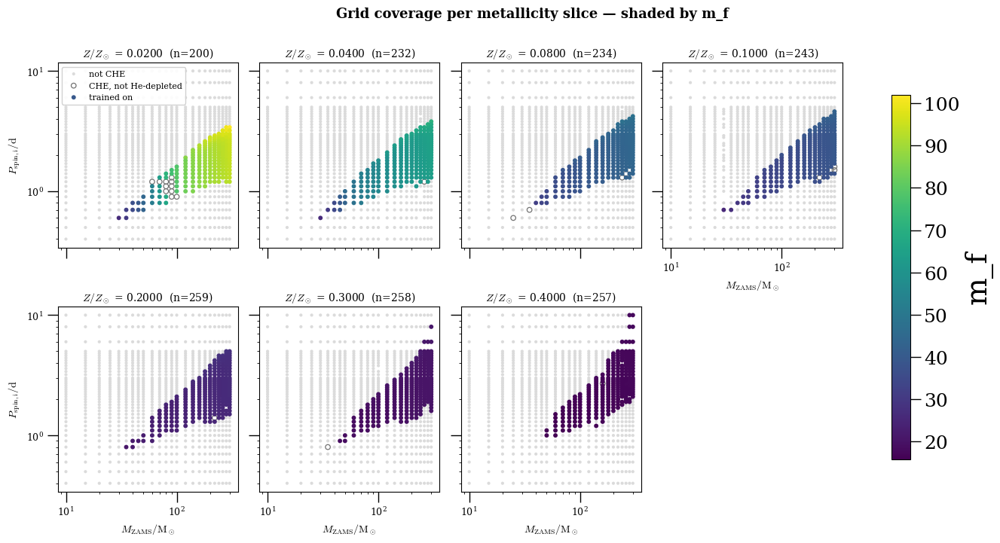

In [38]:
fig, axs = plot_pmz_grid_coverage(core_props_df, var='m_f', cut_non_he_depl=True)
for ax in axs.ravel():
    ax.set_yscale('log')
    ax.set_xscale('log')

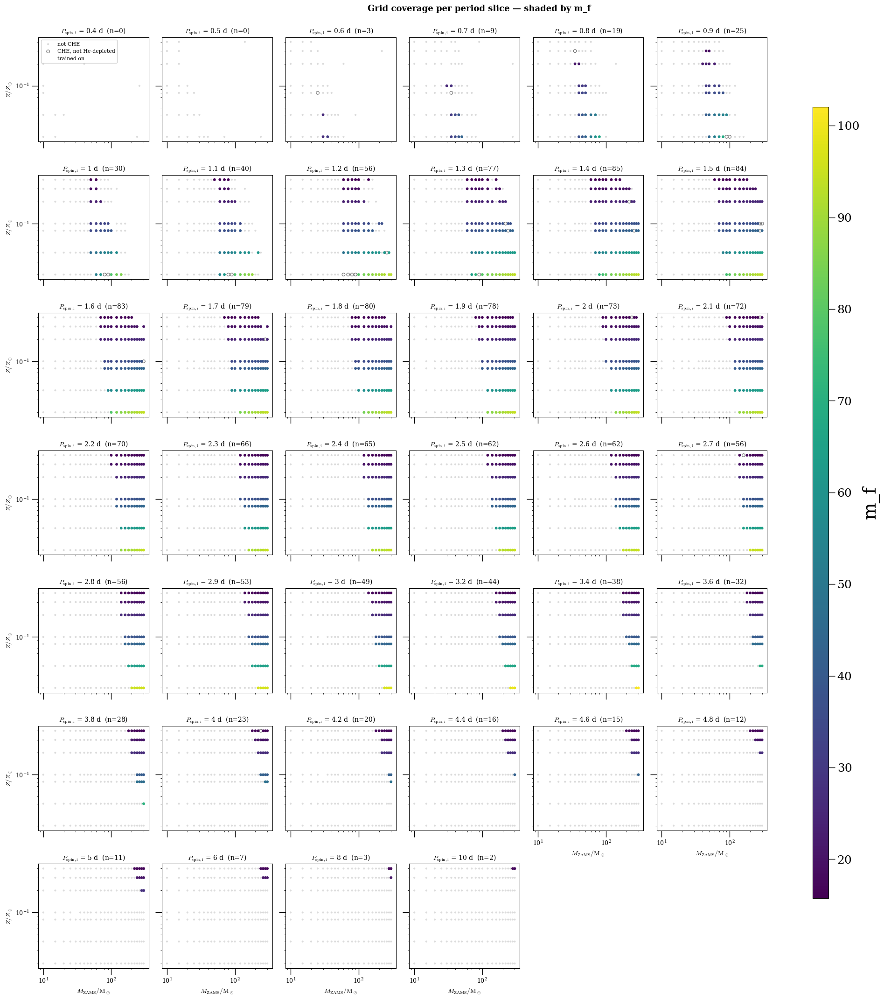

In [39]:
fig, axs = plot_pmz_grid_coverage_by_period(core_props_df, var='m_f', cut_non_he_depl=True, ncols=6)
for ax in axs.ravel():
    ax.set_yscale('log')
    ax.set_xscale('log')

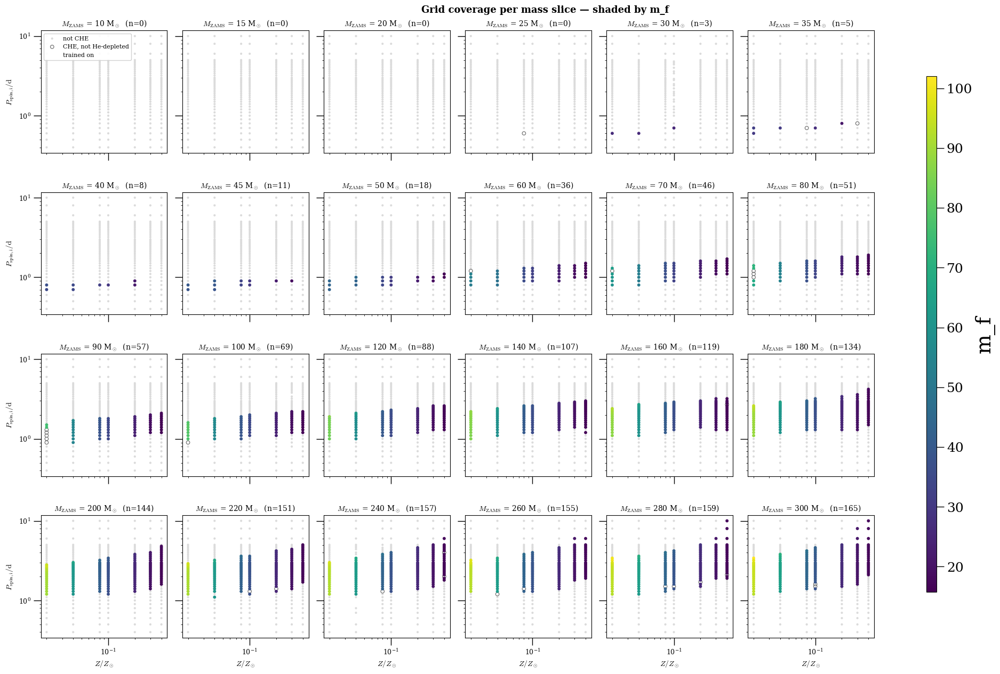

In [40]:
fig, axs = plot_pmz_grid_coverage_by_mass(core_props_df, var='m_f', cut_non_he_depl=True, ncols=6)
for ax in axs.ravel():
    ax.set_yscale('log')
    ax.set_xscale('log')

### 1.2 Data X Interpolator over P, M, Z slices

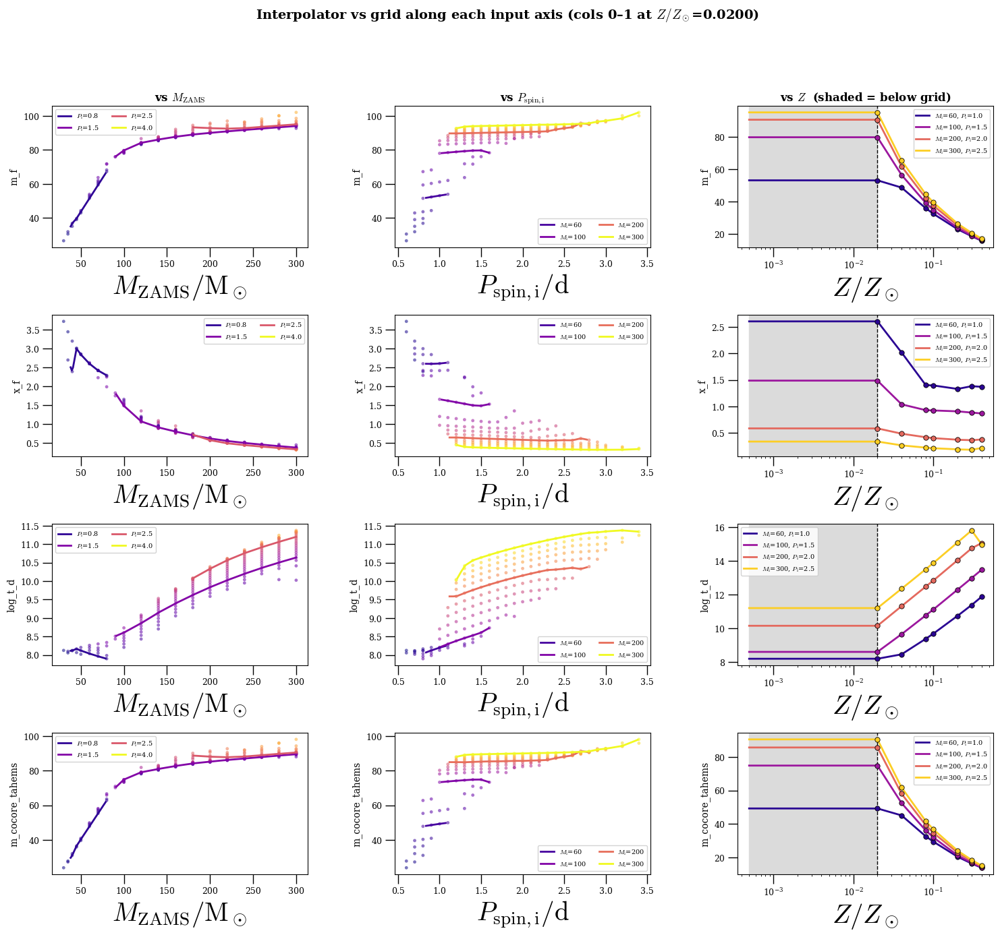

In [41]:
fig, axs = plot_pmz_axis_slices(
    ip_models, core_props_df,
    p_probes=(0.8, 1.5, 2.5, 4.0),
    m_probes=(60.0, 100.0, 200.0, 300.0),
    mp_probes=((60.0, 1.0), (100.0, 1.5), (200.0, 2.0), (300.0, 2.5)),
    z_range=(5e-4, 0.4),
    z_key_for_mp=Z_KEYS[0]
)

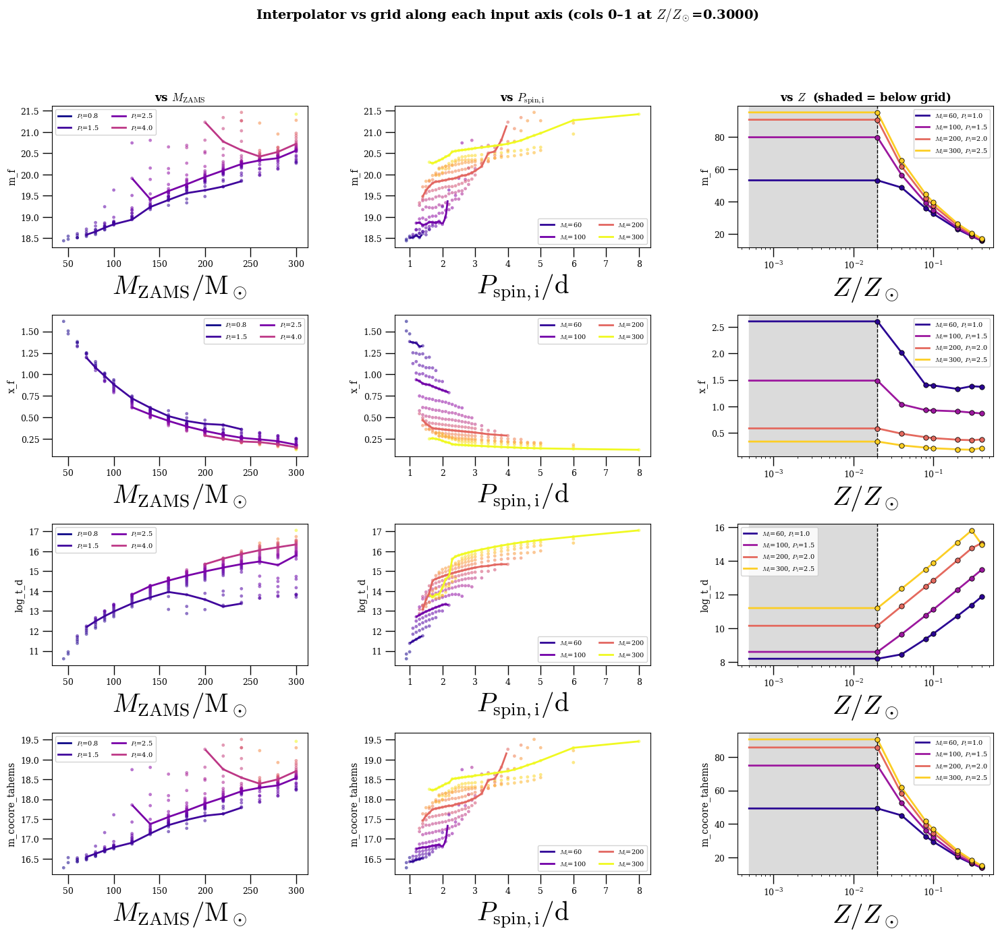

In [42]:
fig, axs = plot_pmz_axis_slices(
    ip_models, core_props_df,
    p_probes=(0.8, 1.5, 2.5, 4.0),
    m_probes=(60.0, 100.0, 200.0, 300.0),
    mp_probes=((60.0, 1.0), (100.0, 1.5), (200.0, 2.0), (300.0, 2.5)),
    z_range=(5e-4, 0.4),
    z_key_for_mp=Z_KEYS[-2]
)

### 1.3 Interpolator coverage

Check whether the CHE window is covered by the interpolator and whether it is well-behaved within the window. Expected behavior:

* Panel 1: shows the lowest metallicity for which data is available at each M,P pair. Lowest metallicity can only *increase* for fixed M as P increases (high-metallicity mass loss creates stripped slow rotators that are classified as CHE). 
* Panel 2: number of metallicities covering each M,P pair. Likewise, should decrease as P increases for fixed M.
* Panel 3: some ```var``` returned by the interpolator for each M,P pair at a metallicity below the grid minimum (```z_probe```). At this metallicity, the interpolator should only return finite values within the CHE window corresponding to the lowest grid metallicity (lowest metallicity in panel 1, highest coverage in panel 2), and NaN everywhere else (white region in Panel 3). It is assumed that the lowest metallicity in the grid is low enough that mass loss below it is the same, so it is extrapolated downwards. If any other regions are covered by the interpolator, this indicates that it is extrapolating where it should not.

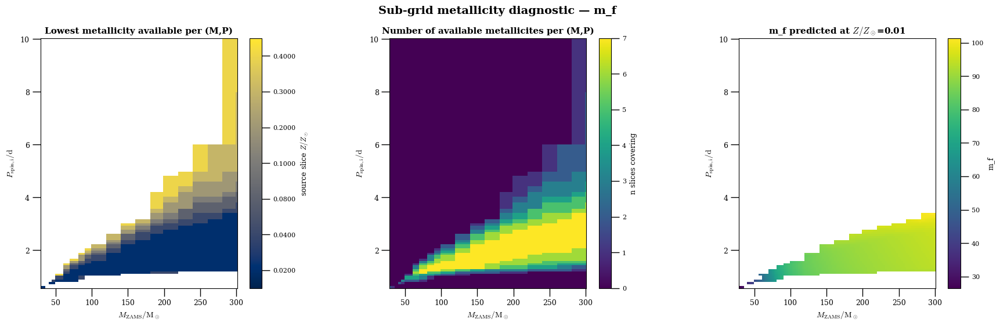

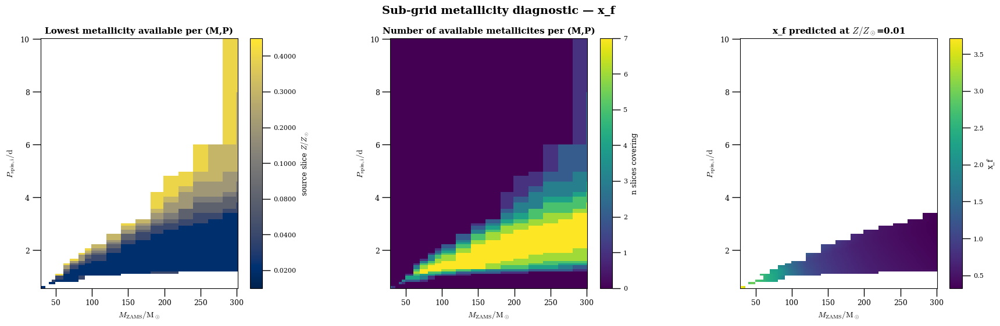

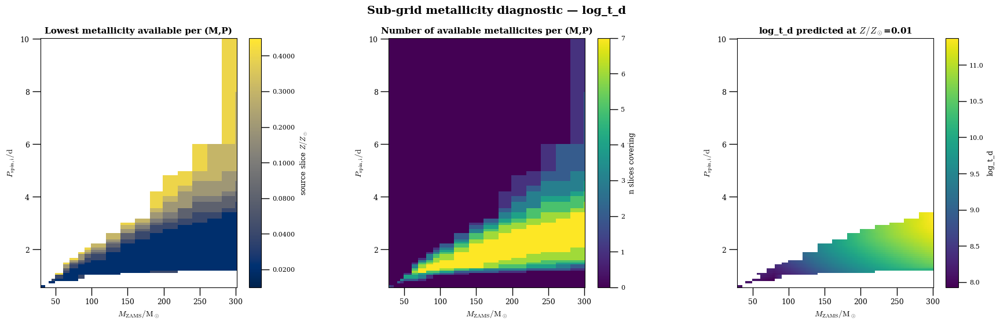

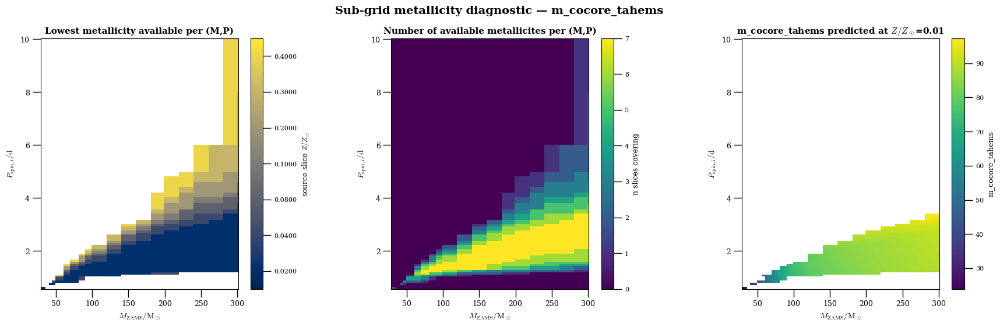

In [43]:
for var in PIPELINE_VARS:
    fig, axs, diag = plot_pmz_source_z_diagnostic(
        ip_models[var], core_props_df,
        z_probe=1e-2,          # inside the lowest population metallicity bin
        n_grid=120,
        cache_path=OUTPUT_FOLDER / f'scan_{var}_z8e-4.npz',
    )

At a glance evaluation: any stair-like patterns indicate issues with interpolator. Stair patterns for the highest periods available at each mass are characeristic of an ill-behaved interpolator discontinuously jumping up to the next lowest metallicity as period goes up and results in contamination of low metallicity populations with high metallicity (low final mass) results.

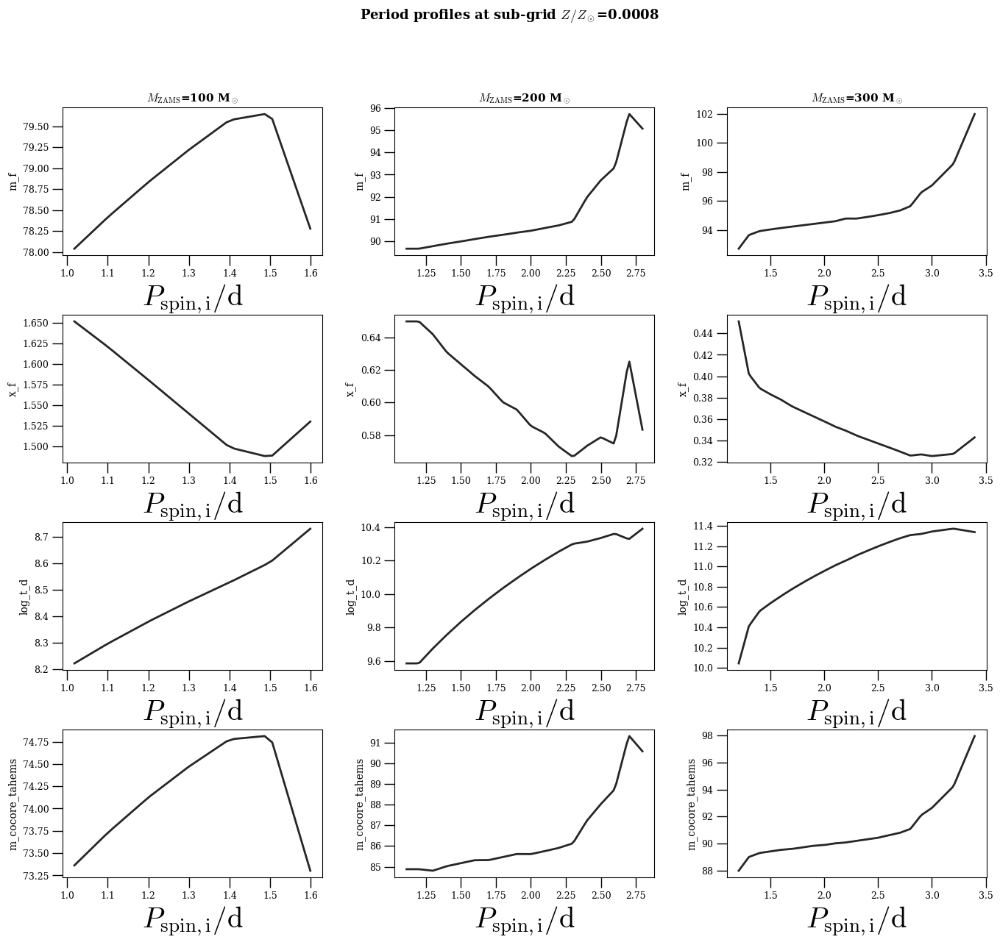

In [44]:

fig, axs = plot_pmz_subgrid_step_profiles(
    ip_models, z_probe=8e-4, m_probes=(100.0, 200.0, 300.0), p_range=(0.4, 6.0),
)

### 1.4 Interpolator consistency check for interpolated populations

Test analogous to 1.3 but for a full synthetic population produced by the interpolator. The user should ensure that the synthetic population was indeed generated by the current version of the interpolator for a meaningful diagnosis. 

This section extracts the systems at metallicities below the minimum grid metallicity in a synthetic population and runs their initial properties against the interpolator again to check that their *final* properties are exclusively supplied by the minimum metallicity grid.

Down-extrapolation of high metallicites to low metallicities at the upper period edge are characterized in the mass x delay time plane by diagonal ridges running low delay time, low mass to high delay time, high mass. The ridges separate large branches of the population entirely supplied by a single grid metallicity at high periods.

In [45]:
IP_POP_DIR = DATA_DIR / 'output' / 'ip_pop'
POP_PATH = IP_POP_DIR / (
    'ip_pop_minz5e-4_maxz1e0_loguniform_interpolator_res1e+08'
    '_zextTrue_interpolator_00_fiducial_df.h5'
)
pop_df = pd.read_hdf(POP_PATH, 'df')

# Same binning plot_results_panel_df uses (_Z_INTERVALS in 64WIP cell 13).
Z_INTERVALS = np.logspace(np.log10(0.0005), np.log10(0.4), 7)
print(f'{len(pop_df)} drawn, {pop_df.m_f.notna().sum()} CHE')
print('lowest bin:', f'{Z_INTERVALS[0]:.4g} <= Z/Zsun < {Z_INTERVALS[1]:.4g}')

1000000 drawn, 29476 CHE
lowest bin: 0.0005 <= Z/Zsun < 0.001523


,size,min,max
source_z_key,,,
0.0200,5169,35.3,100.9


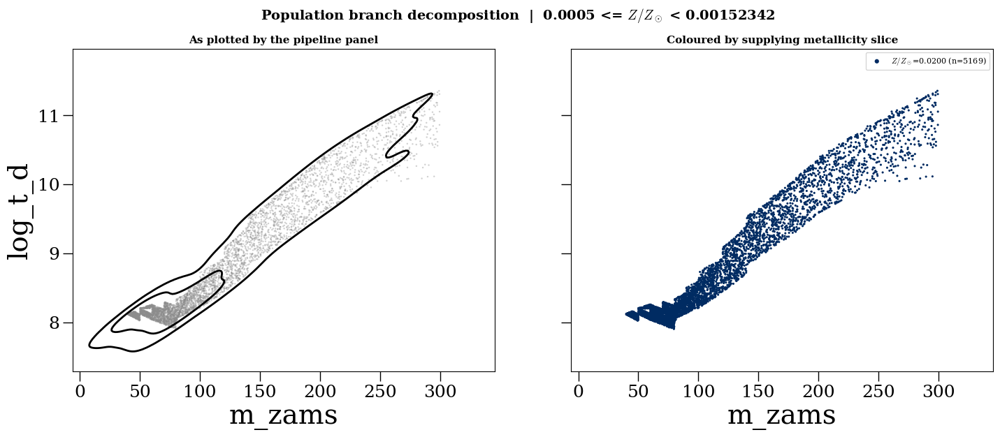

In [46]:
fig, axs, labelled_df = plot_population_source_z_decomposition(
    pop_df, ip_models['m_f'],
    x_col='m_zams', y_col='log_t_d',
    z_lo=Z_INTERVALS[0], z_hi=Z_INTERVALS[1],
    n_grid=400,
)
labelled_df.groupby('source_z_key').m_f.agg(['size', 'min', 'max']).round(1)

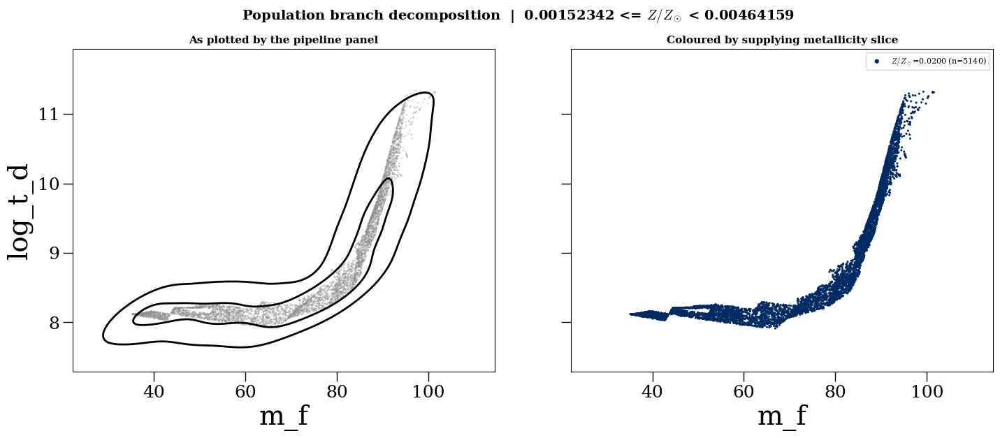

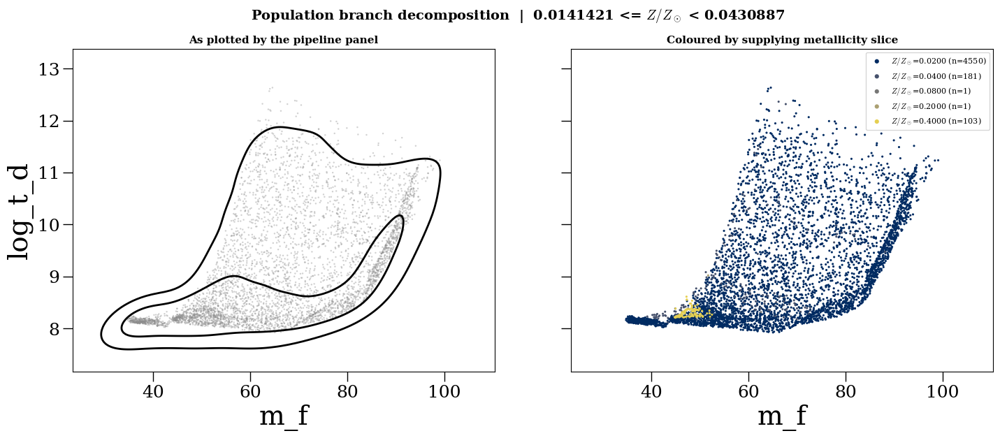

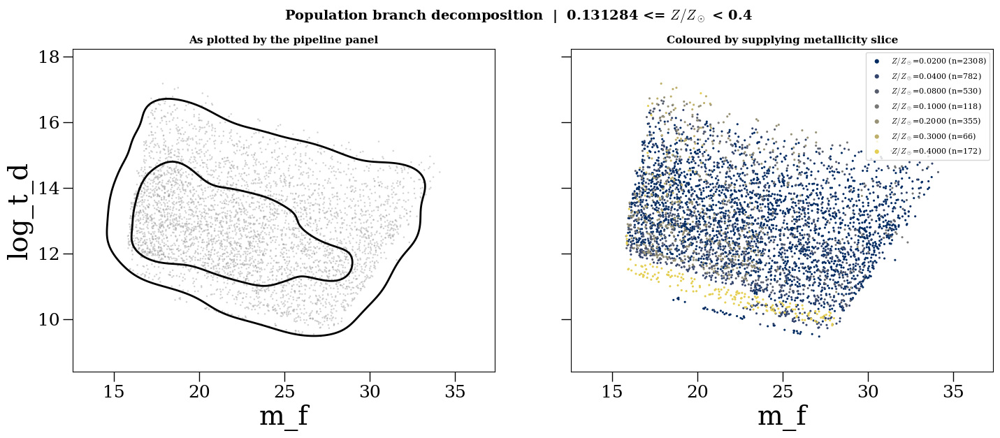

In [47]:
# Does the same happen in the higher bins, where the grid does cover the samples?
for i in [1, 3, 5]:
    fig, axs, _ = plot_population_source_z_decomposition(
        pop_df, ip_models['m_f'],
        z_lo=Z_INTERVALS[i], z_hi=Z_INTERVALS[i + 1], n_grid=400,
    )

In [19]:
interpolator = PMZLinearInterpolator(core_props_df, var='m_f', cut_non_he_depl=True)

/tmp/ipykernel_2869876/2558403420.py:1: UserWarning: [PMZLinearInterpolator var=m_f] 11 (m, p) column(s) whose valid metallicities form one run reaching neither metallicity global minimum nor maximum. Is this a broad CHE window cusp or error? Interpolator will continue. Cells: (30, 0.7, XXXOXXX), (35, 0.8, XXXXOXX), (40, 0.9, XXXXOXX), (45, 0.9, XOOOOOX), (80, 1, XOOOXXX), (90, 0.9, XOXXXXX), (90, 1, XOOOXXX), (90, 1.1, XOOOOXX), ... (+3 more)
  interpolator = PMZLinearInterpolator(core_props_df, var='m_f', cut_non_he_depl=True)
/tmp/ipykernel_2869876/2558403420.py:1: UserWarning: [PMZLinearInterpolator var=m_f] 12 (m, p) column(s) whose valid metallicities form two or more separate runs. Check input data for crashed CHE cases. Interpolator will smooth over gaps. Cells: (35, 0.7, OOXOXXX), (140, 1.2, OOOOXXO), (160, 1.3, OOOOXOO), (200, 1.2, OOXOXXX), (220, 1.2, OXXOXXX), (220, 1.3, OOOXOXX), (220, 1.4, OOOOXOX), (240, 1.3, OOXOXXX), ... (+4 more)
  interpolator = PMZLinearInterpolator

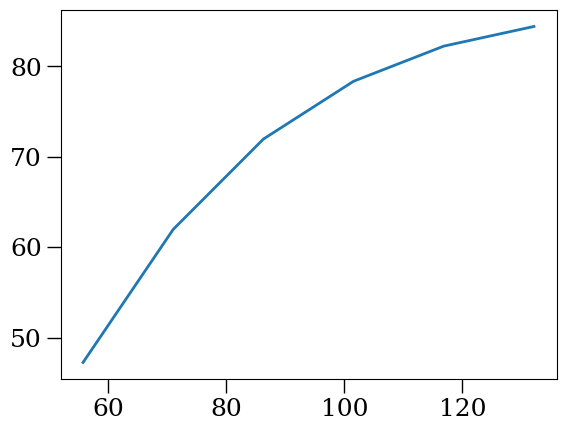

In [7]:
mi = np.linspace(10, 300, 20)
vec_get_far = np.vectorize(interpolator.get_var)
mf = vec_get_far(mi, 1, 0.02)
plt.plot(mi, mf)

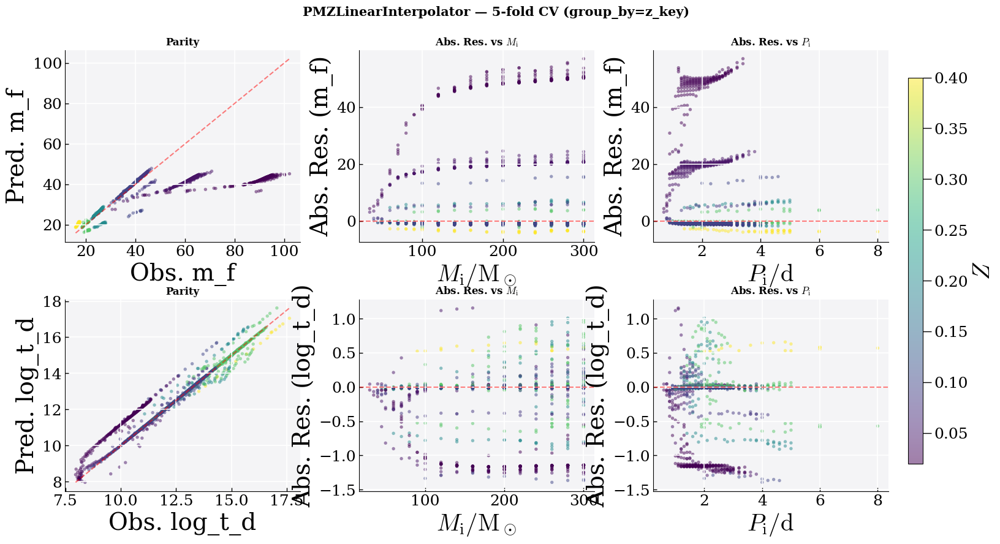

In [8]:
fig, axs, oofs = plot_pmz_cv_diagnostic(
    PMZLinearInterpolator, core_props_df,
    mass_var="m_f", time_var="log_t_d",
    k=5, group_by="z_key",          # leave-one-Z-out
    cut_non_he_depl=True,
)


TODO
* k-fold for some reason cannot produce residuals
* current coloring by initial Porb is not good

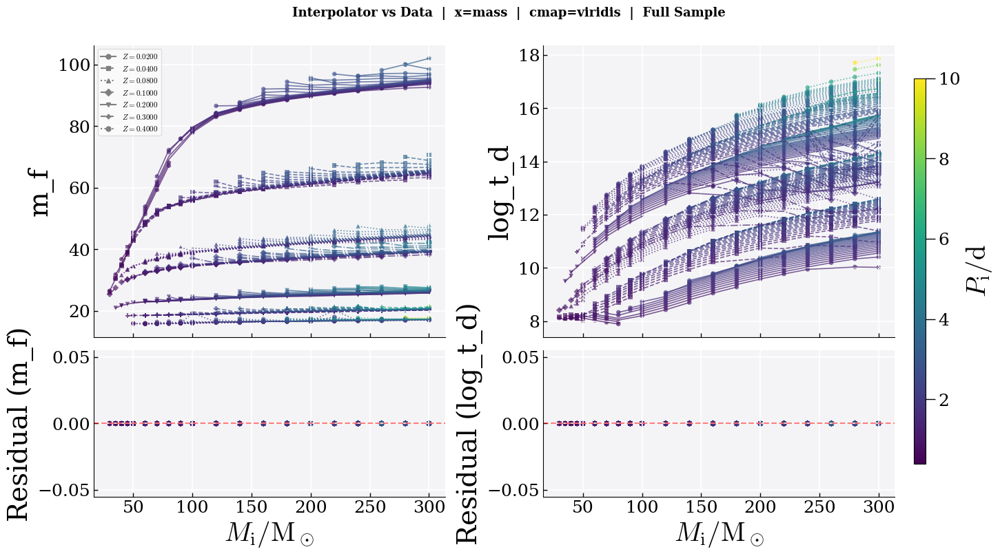

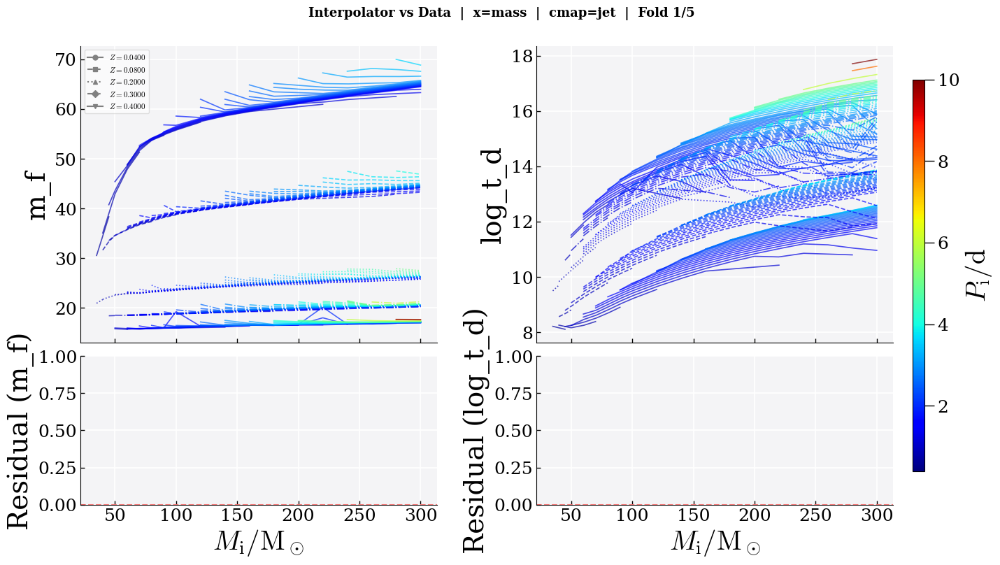

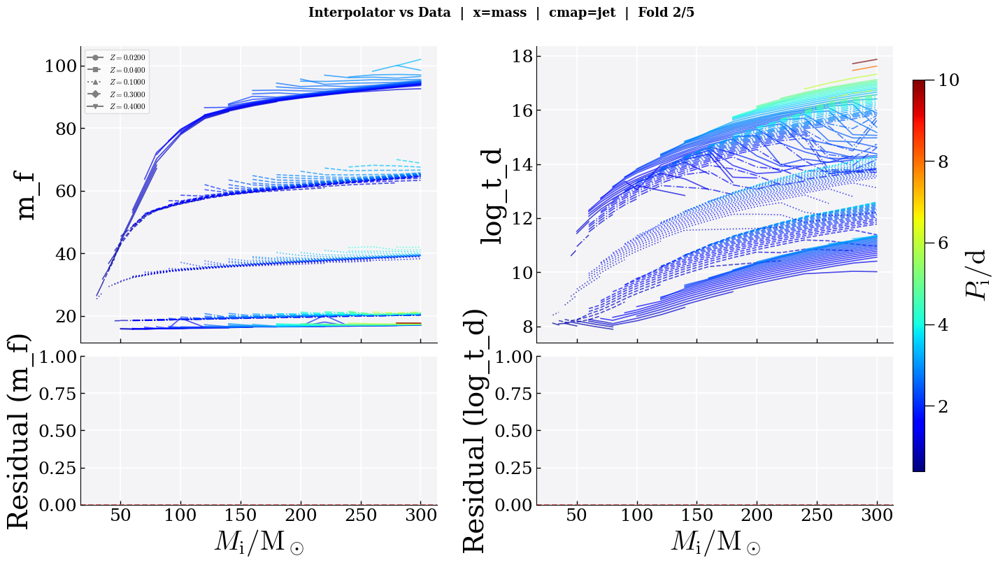

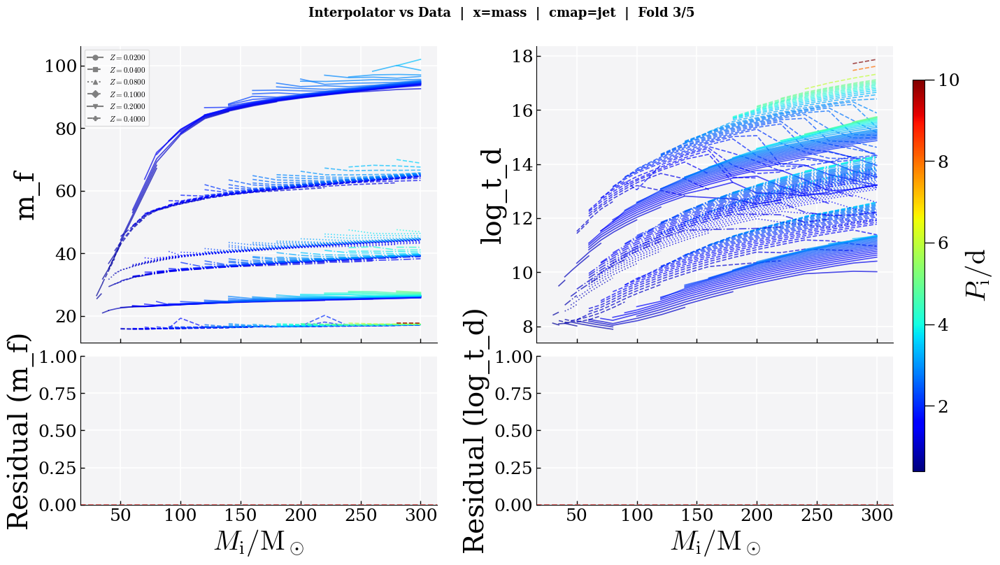

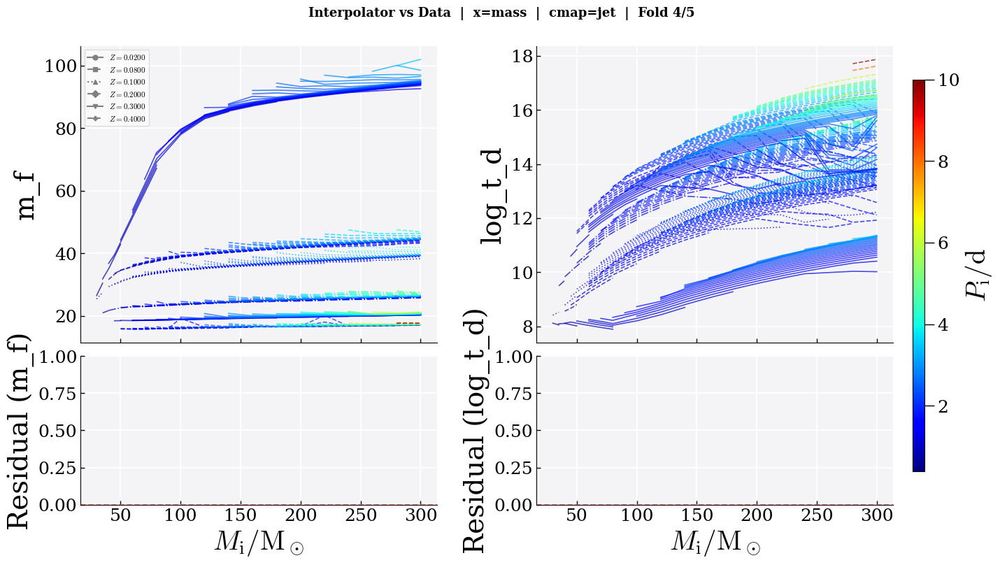

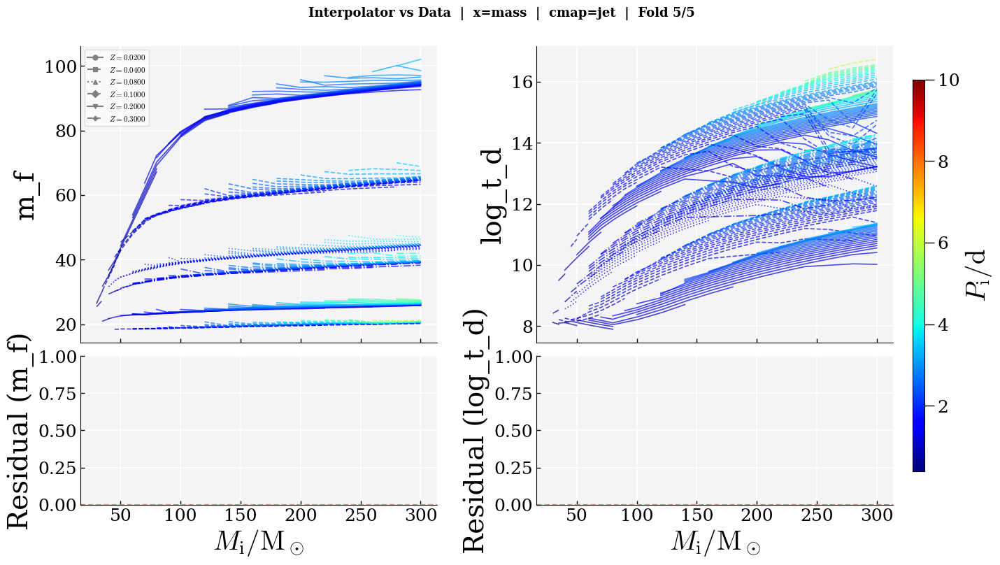

In [9]:
# Whole sample — one figure
figs = plot_pmz_interpolator_fit(PMZLinearInterpolator, core_props_df, cut_non_he_depl=True)
fig, axs = figs[0]

# 5-fold CV — five figures
figs = plot_pmz_interpolator_fit(
    PMZLinearInterpolator, core_props_df,
    k=5, group_by="z_key",
    cut_non_he_depl=True,
    c_cmap=plt.cm.jet
)
#for fold_idx, (fig, axs) in enumerate(figs):
#    fig.savefig(f"fold_{fold_idx}.png")


In [10]:
analytical = PMZWindPileupModel(core_props_df, 'm_f')

In [11]:
analytical.fit()

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

               mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
alpha         0.215  0.010   0.196    0.234      0.000    0.000    1049.0   
beta          4.616  0.050   4.528    4.717      0.002    0.001     872.0   
log_mdot_ref -9.000  0.052  -9.105   -8.906      0.002    0.001     887.0   
gamma         2.055  0.027   2.006    2.107      0.001    0.001     878.0   
delta        -0.198  0.006  -0.210   -0.186      0.000    0.000    1662.0   

              ess_tail  r_hat  
alpha           1393.0   1.00  
beta            1111.0   1.01  
log_mdot_ref    1173.0   1.01  
gamma           1211.0   1.01  
delta           1817.0   1.00  

Convergence [m_f]: max r_hat=1.0100, min ESS=872 — WARNING: check chains


Inference data with groups:
	> posterior
	> sample_stats
	> observed_data

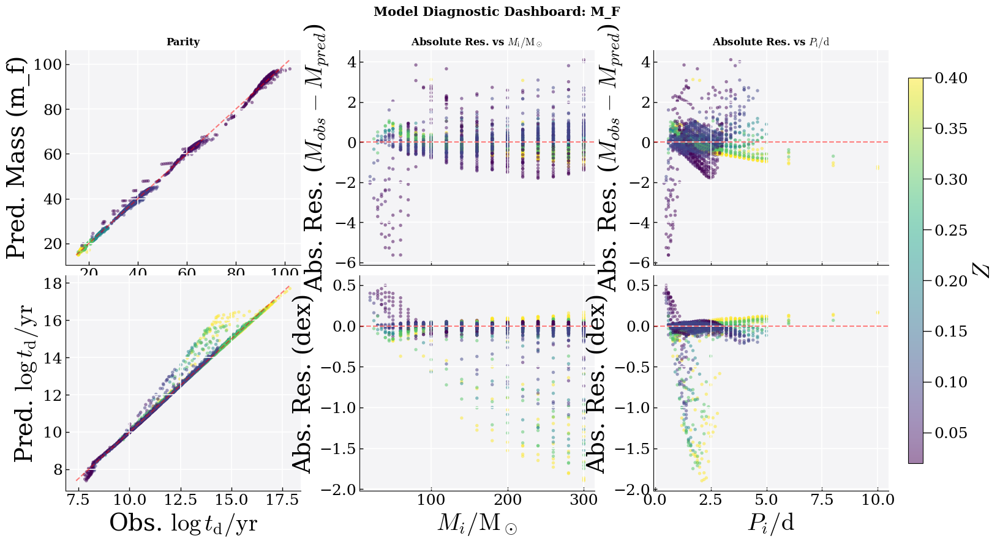

(<Figure size 1600x900 with 7 Axes>,
 array([[<Axes: title={'center': 'Parity'}, ylabel='Pred. Mass (m_f)'>,
         <Axes: title={'center': 'Absolute Res. vs $M_\\mathrm{i}/\\mathrm{M}_\\odot$'}, ylabel='Abs. Res. ($M_{obs} - M_{pred}$)'>,
         <Axes: title={'center': 'Absolute Res. vs $P_\\mathrm{i}/\\mathrm{d}$'}, ylabel='Abs. Res. ($M_{obs} - M_{pred}$)'>],
        [<Axes: xlabel='Obs. $\\log t_\\mathrm{d} / \\mathrm{yr}$', ylabel='Pred. $\\log t_\\mathrm{d} / \\mathrm{yr}$'>,
         <Axes: xlabel='$M_{i}/\\mathrm{M}_\\odot$', ylabel='Abs. Res. (dex)'>,
         <Axes: xlabel='$P_{i}/\\mathrm{d}$', ylabel='Abs. Res. (dex)'>]],
       dtype=object))

In [12]:
analytical.plot_diagnostic()

(<Figure size 1600x700 with 3 Axes>,
 (<Axes: title={'center': '$M_\\mathrm{i}/\\mathrm{M}_\\odot$ vs $M_\\mathrm{f}/\\mathrm{M}_\\odot$'}, xlabel='$M_\\mathrm{i}/\\mathrm{M}_\\odot$', ylabel='$M_\\mathrm{f}/\\mathrm{M}_\\odot$'>,
  <Axes: title={'center': '$P_\\mathrm{i}/\\mathrm{d}$ vs $M_\\mathrm{f}/\\mathrm{M}_\\odot$'}, xlabel='$P_\\mathrm{i}/\\mathrm{d}$', ylabel='$M_\\mathrm{f}/\\mathrm{M}_\\odot$'>))

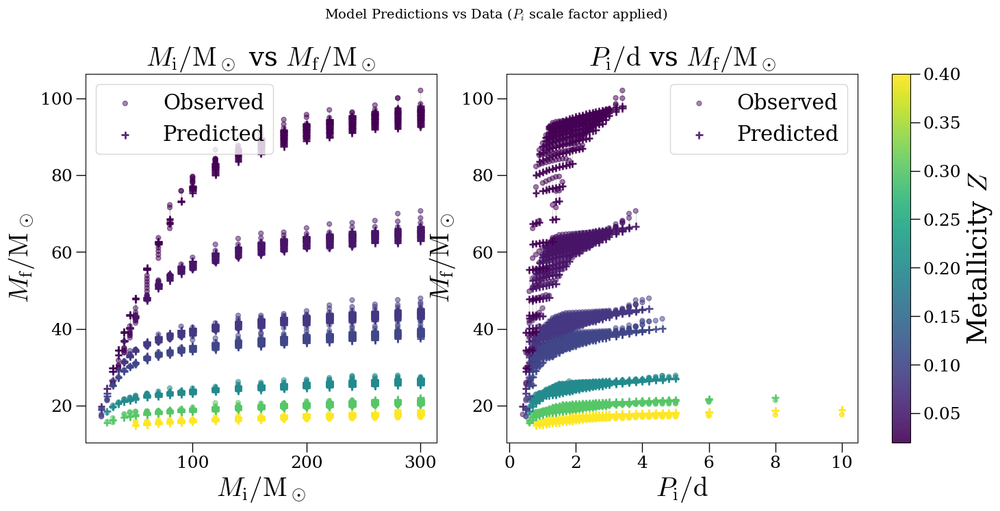

In [13]:
analytical.plot_relationship(y_var='m_f')      # Initial Mass vs Final Mass

# The function handles the necessary transformations and uses the posterior medians to 
# show how well the model "line" tracks the underlying data points. For $a_f$, it only 
# plots the predicted values as $a_f$ is typically a derived property rather than a 
# direct observation in the input dataframe.

(<Figure size 1600x700 with 3 Axes>,
 (<Axes: title={'center': '$M_\\mathrm{i}/\\mathrm{M}_\\odot$ vs $A_\\mathrm{f}/\\mathrm{R}_\\odot$'}, xlabel='$M_\\mathrm{i}/\\mathrm{M}_\\odot$', ylabel='$A_\\mathrm{f}/\\mathrm{R}_\\odot$'>,
  <Axes: title={'center': '$P_\\mathrm{i}/\\mathrm{d}$ vs $A_\\mathrm{f}/\\mathrm{R}_\\odot$'}, xlabel='$P_\\mathrm{i}/\\mathrm{d}$', ylabel='$A_\\mathrm{f}/\\mathrm{R}_\\odot$'>))

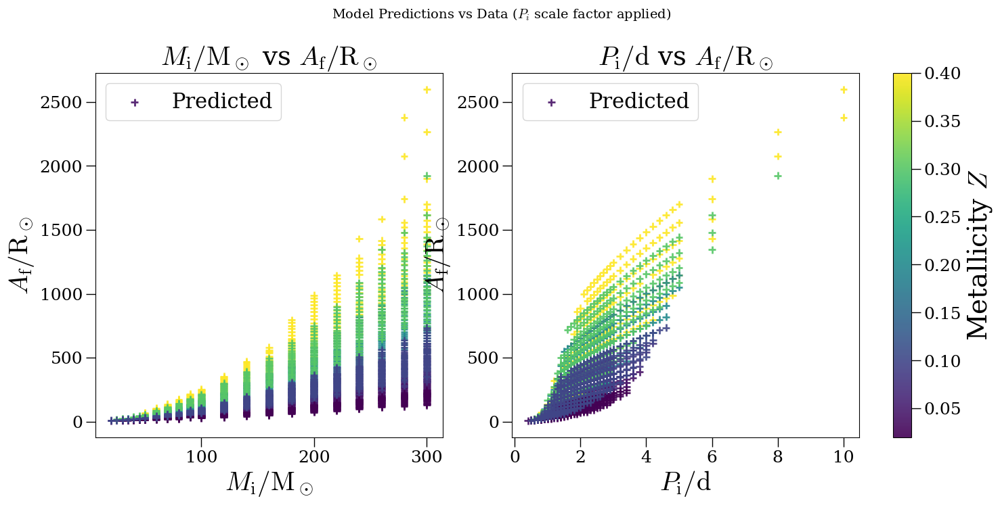

In [14]:
analytical.plot_relationship(y_var='a_f')      # Initial Mass vs Final Semi-major Axis


(<Figure size 1600x700 with 3 Axes>,
 (<Axes: title={'center': '$M_\\mathrm{i}/\\mathrm{M}_\\odot$ vs $\\log t_\\mathrm{d}/\\mathrm{yr}$'}, xlabel='$M_\\mathrm{i}/\\mathrm{M}_\\odot$', ylabel='$\\log t_\\mathrm{d}/\\mathrm{yr}$'>,
  <Axes: title={'center': '$P_\\mathrm{i}/\\mathrm{d}$ vs $\\log t_\\mathrm{d}/\\mathrm{yr}$'}, xlabel='$P_\\mathrm{i}/\\mathrm{d}$', ylabel='$\\log t_\\mathrm{d}/\\mathrm{yr}$'>))

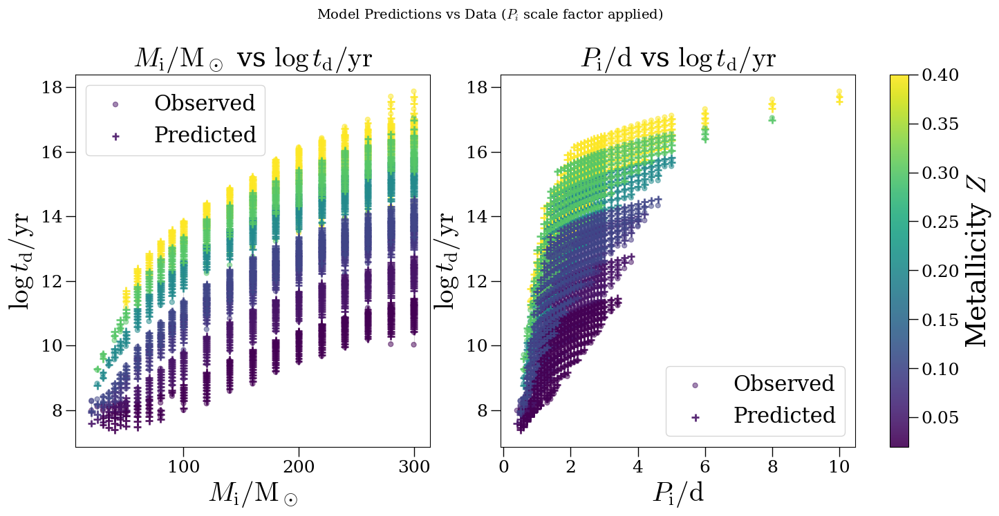

In [15]:
analytical.plot_relationship(y_var='log_t_d')  # Initial Mass vs Delay Time

### Delay time test

In [16]:
logtd_analytical = PMZWindPileupModel(core_props_df, 'log_t_d', use_alt_mf_map=True)

In [17]:
logtd_analytical.fit()

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

There were 39 divergences after tuning. Increase `target_accept` or reparameterize.


               mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
alpha         0.578  0.110   0.404    0.767      0.005    0.010     803.0   
beta          4.899  0.214   4.496    5.316      0.006    0.004    1340.0   
log_mdot_ref -9.119  0.277  -9.677   -8.643      0.009    0.006     967.0   
gamma         2.075  0.110   1.883    2.302      0.003    0.002    1351.0   
delta        -0.002  0.002  -0.005   -0.000      0.000    0.000    1922.0   
eta           0.730  0.892   0.000    2.413      0.031    0.039     833.0   
delta_alpha   0.116  0.443  -0.554    1.031      0.016    0.023     952.0   

              ess_tail  r_hat  
alpha            523.0    1.0  
beta            1756.0    1.0  
log_mdot_ref     960.0    1.0  
gamma           1781.0    1.0  
delta           1335.0    1.0  
eta             1109.0    1.0  
delta_alpha      758.0    1.0  

Convergence [log_t_d]: max r_hat=1.0000, min ESS=523 — OK


Inference data with groups:
	> posterior
	> sample_stats
	> observed_data

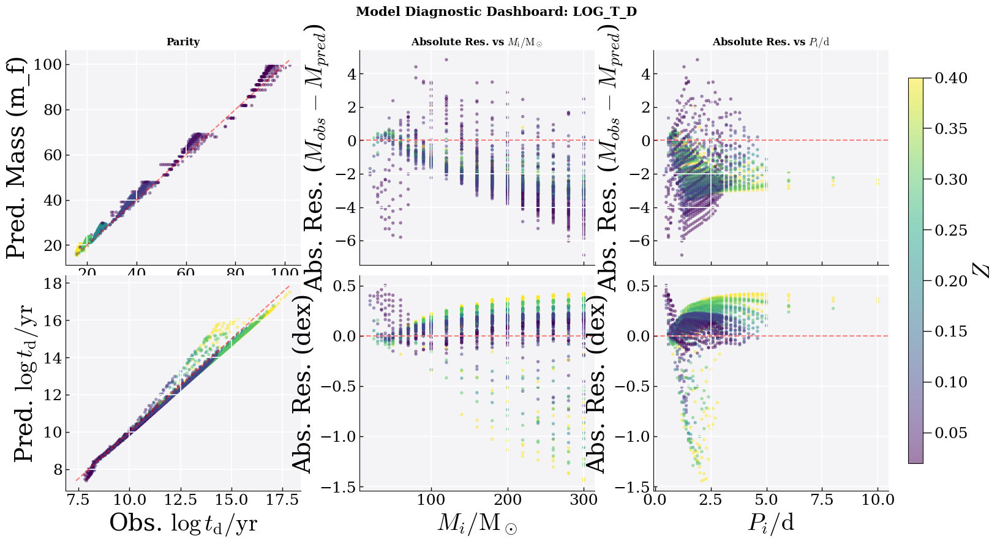

(<Figure size 1600x900 with 7 Axes>,
 array([[<Axes: title={'center': 'Parity'}, ylabel='Pred. Mass (m_f)'>,
         <Axes: title={'center': 'Absolute Res. vs $M_\\mathrm{i}/\\mathrm{M}_\\odot$'}, ylabel='Abs. Res. ($M_{obs} - M_{pred}$)'>,
         <Axes: title={'center': 'Absolute Res. vs $P_\\mathrm{i}/\\mathrm{d}$'}, ylabel='Abs. Res. ($M_{obs} - M_{pred}$)'>],
        [<Axes: xlabel='Obs. $\\log t_\\mathrm{d} / \\mathrm{yr}$', ylabel='Pred. $\\log t_\\mathrm{d} / \\mathrm{yr}$'>,
         <Axes: xlabel='$M_{i}/\\mathrm{M}_\\odot$', ylabel='Abs. Res. (dex)'>,
         <Axes: xlabel='$P_{i}/\\mathrm{d}$', ylabel='Abs. Res. (dex)'>]],
       dtype=object))

In [18]:
logtd_analytical.plot_diagnostic()

## Evaluation

In [19]:
from src.eval import run_test_suite

In [20]:
working_che_core_props_df = core_props_df[core_props_df.is_che & core_props_df.is_He_depleted]

In [21]:
structured_configs = [
                {'name': 'Stride 1',                'm_zams': 1, 'p_spin_zams': 1, 'z': 1},
                #{'name': 'Stride 2 (P)',            'm_zams': 1, 'p_spin_zams': 2, 'z': 1},
                {'name': 'Stride 2 (P, M)',         'm_zams': 2, 'p_spin_zams': 2, 'z': 1},
            # {'name': 'Stride 3 (P)',            'm_zams': 2, 'p_spin_zams': 3, 'z': 1},
                {'name': 'Stride 3 (P, M)',         'm_zams': 3, 'p_spin_zams': 3, 'z': 1},
            # {'name': 'Stride 4 (P)',            'm_zams': 3, 'p_spin_zams': 4, 'z': 1},
                {'name': 'Stride 4 (P, M)',         'm_zams': 4, 'p_spin_zams': 4, 'z': 1},
                {'name': 'Stride 5 (P, M)',         'm_zams': 5, 'p_spin_zams': 5, 'z': 1},
                {'name': 'Stride 6 (P, M)',         'm_zams': 6, 'p_spin_zams': 6, 'z': 1},
                {'name': 'Stride 7 (P, M)',         'm_zams': 7, 'p_spin_zams': 7, 'z': 1},
                {'name': 'Stride 8 (P, M)',         'm_zams': 8, 'p_spin_zams': 8, 'z': 1},
                {'name': 'Stride 6 (P, M) + 2 (Z)',         'm_zams': 6, 'p_spin_zams': 6, 'z': 2},
                {'name': 'Stride 6 (P, M) + 3 (Z)',         'm_zams': 6, 'p_spin_zams': 6, 'z': 3},
            ]

In [22]:
train_fracs = [1.0, 0.75, 0.5, 0.25, 0.1, 0.05, 0.025, 0.01]

In [23]:
run_id = 'v1'

In [24]:
run_test_suite(
    work_df=working_che_core_props_df,
    output_folder=OUTPUT_FOLDER,
    run_id=run_id,
    structured_configs=structured_configs,
    train_fracs=train_fracs,
    force_model_storage=True
)

=== Starting Benchmark Run: v1 ===
Output Directory: ../data/nb_output/nbxx/benchmark_v1
Logging Output To: ../data/nb_output/nbxx/benchmark_v1/benchmark_20260824_164944.log

[+] Found existing Experiment 1 results at ../data/nb_output/nbxx/benchmark_v1/random_sparse_results.csv.

[+] All sparsity fractions already computed. Skipping compute...

=== RANDOM SPARSITY BENCHMARK SUMMARY (CACHED) ===
 train_frac  phys_rmse_mean  phys_rmse_std  interp_rmse_mean  interp_rmse_std  interp_nan_frac_mean  interp_nan_frac_std
      0.010           1.064          0.080             0.872            0.075                 0.001                0.002
      0.025           1.026          0.083             0.811            0.063                 0.001                0.002
      0.050           0.983          0.080             0.742            0.083                 0.001                0.002
      0.100           0.919          0.084             0.637            0.093                 0.001                0.

There were 5 divergences after tuning. Increase `target_accept` or reparameterize.


Fitting Interpolator on Sparse Grid...

=== STRUCTURED GRID TEST RESULTS ===
  Physical Model RMSE : 0.894 M_sun
  Interpolator RMSE   : 34.237 M_sun
  Interpolator Fails  : 73.2% (Returned NaN)

[+] Pickling Physical Model to ../data/nb_output/nbxx/benchmark_v1...
[+] Pickling Interpolator Model to ../data/nb_output/nbxx/benchmark_v1...


In [25]:
from src.popsynth import PMZWindPileupModel

In [26]:
physmodel = PMZWindPileupModel(working_che_core_props_df[::10], 'm_f', 4)

In [27]:
physmodel.get_mf_logtd(
    working_che_core_props_df.m_zams.values,
    working_che_core_props_df.p_spin_zams.values,
    working_che_core_props_df.z.values
)[0]

ValueError: Model parameters not fitted yet. Call fit() first.

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

               mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
alpha         0.193  0.032   0.134    0.254      0.001    0.001     775.0   
beta          4.361  0.172   4.055    4.697      0.007    0.005     629.0   
log_mdot_ref -5.637  0.038  -5.711   -5.571      0.001    0.001     697.0   
gamma         1.912  0.092   1.740    2.082      0.004    0.002     639.0   
delta        -0.187  0.019  -0.220   -0.150      0.000    0.000    1745.0   

              ess_tail  r_hat  
alpha           1223.0    1.0  
beta             920.0    1.0  
log_mdot_ref    1012.0    1.0  
gamma            947.0    1.0  
delta           2019.0    1.0  


Inference data with groups:
	> posterior
	> sample_stats
	> observed_data

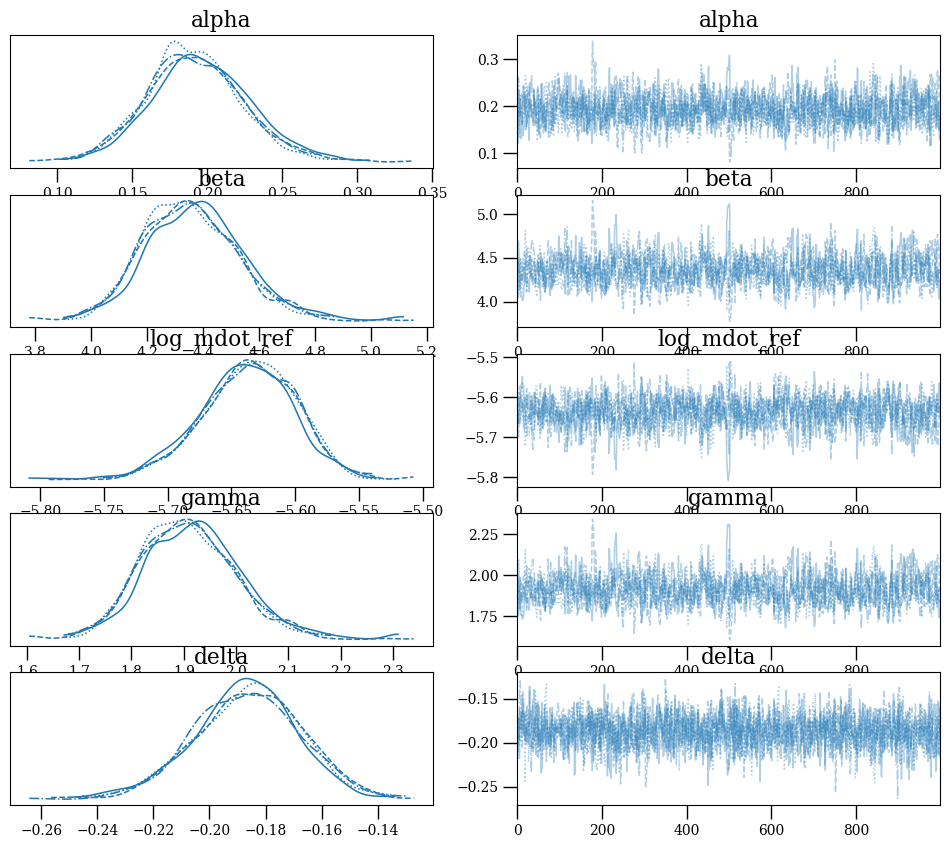

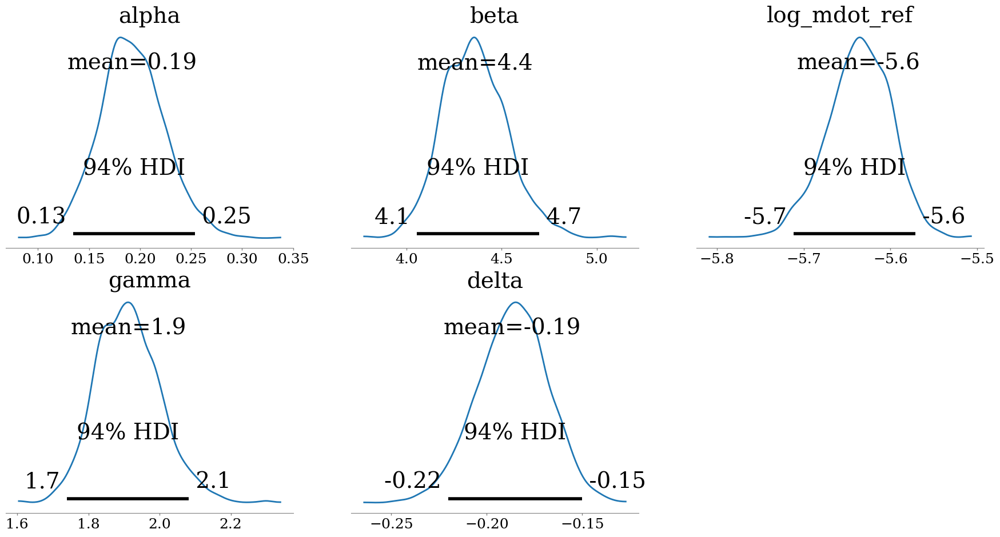

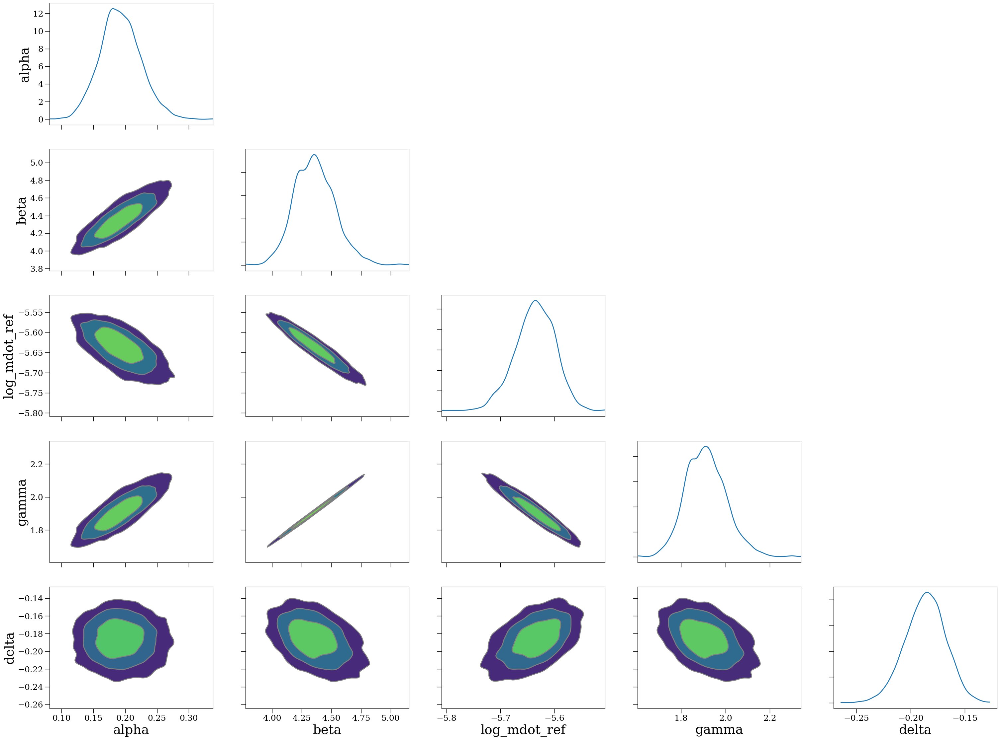

In [ ]:
physmodel.fit()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

def plot_random_sparsity_benchmark(summary_df, out_path=None, show=True):
    """
    Plots the results of Experiment 1: Random Sparsity.
    Requires the `summary_df` containing mean and std for RMSE and NaN fractions.
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    
    # Sort by fraction descending (1.0 to 0.05)
    df = summary_df.sort_values('train_frac', ascending=False)
    x = df['train_frac'] * 100 # Convert to percentage

    # --- Panel 1: RMSE Comparison ---
    ax1.plot(x, df['phys_rmse_mean'], marker='o', label='Physical Model', color='blue', linewidth=2)
    ax1.fill_between(x, df['phys_rmse_mean'] - df['phys_rmse_std'], 
                     df['phys_rmse_mean'] + df['phys_rmse_std'], color='blue', alpha=0.2)
    
    ax1.plot(x, df['interp_rmse_mean'], marker='s', label='Linear Interpolator', color='red', linestyle='--', linewidth=2)
    ax1.fill_between(x, df['interp_rmse_mean'] - df['interp_rmse_std'], 
                     df['interp_rmse_mean'] + df['interp_rmse_std'], color='red', alpha=0.2)

    ax1.invert_xaxis()  # Read left-to-right as data gets sparser
    ax1.set_xlabel('Training Data Fraction (%)')
    ax1.set_ylabel('RMSE ($M_{\odot}$)')
    ax1.set_title('Model Robustness to Random Sparsity')
    ax1.grid(True, linestyle=':', alpha=0.6)
    ax1.legend()

    # --- Panel 2: Interpolator Failure Rate ---
    ax2.plot(x, df['interp_nan_frac_mean'] * 100, marker='x', color='darkred', linewidth=2)
    ax2.fill_between(x, (df['interp_nan_frac_mean'] - df['interp_nan_frac_std']) * 100, 
                     (df['interp_nan_frac_mean'] + df['interp_nan_frac_std']) * 100, color='darkred', alpha=0.2)
    
    ax2.invert_xaxis()
    ax2.set_xlabel('Training Data Fraction (%)')
    ax2.set_ylabel('Failure Rate (% NaNs)')
    ax2.set_title('Interpolator Topological Failures')
    ax2.grid(True, linestyle=':', alpha=0.6)

    plt.tight_layout()
    if out_path:
        plt.savefig(out_path, dpi=300)
    
    if show:
        plt.show()
        
    return fig


def plot_structured_coarsening_benchmark(coarse_df, out_path=None, show=True):
    """
    Plots the results of Experiment 1B: Structured Grid Coarsening.
    Uses grouped bar charts to compare performance across discrete stride configurations.
    """
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=True)
    
    labels = coarse_df['stride_name'].tolist()
    x = np.arange(len(labels))
    width = 0.35

    # --- Panel 1: RMSE Comparison ---
    ax1.bar(x - width/2, coarse_df['phys_rmse'], width, label='Physical Model', color='blue', alpha=0.8)
    ax1.bar(x + width/2, coarse_df['interp_rmse'], width, label='Linear Interpolator', color='red', alpha=0.8)
    
    ax1.set_ylabel('RMSE ($M_{\odot}$)')
    ax1.set_title('Performance Degradation due to Grid Decimation')
    ax1.legend()
    ax1.grid(axis='y', linestyle=':', alpha=0.6)

    # --- Panel 2: Failure Rate & Grid Size ---
    ax2.bar(x, coarse_df['interp_nan_frac'] * 100, color='darkred', alpha=0.7, label='% Interpolator Fails (NaNs)')
    
    # Add a twin axis to show how small the grid is getting
    ax3 = ax2.twinx()
    ax3.plot(x, coarse_df['train_size'], color='black', marker='D', linestyle='-', linewidth=2, label='Grid Points')
    ax3.set_ylabel('Remaining Grid Points (Train Size)', color='black')
    ax3.set_yscale('log') # Log scale helps visualize dramatic grid reductions
    
    ax2.set_ylabel('Interpolator Failure Rate (%)', color='darkred')
    ax2.set_xticks(x)
    ax2.set_xticklabels(labels, rotation=45, ha='right')
    
    # Combine legends for the bottom plot
    lines, labels1 = ax2.get_legend_handles_labels()
    lines2, labels2 = ax3.get_legend_handles_labels()
    ax2.legend(lines + lines2, labels1 + labels2, loc='upper left')

    plt.tight_layout()
    if out_path:
        plt.savefig(out_path, dpi=300)
        
    if show:
        plt.show()
        
    return fig


def plot_structured_extrapolation_spatial_residuals(test_df, phys_pred, interp_pred, z_slice=None, out_path=None, show=True):
    """
    Diagnostic plot for Experiment 2: Structured Extrapolation.
    Plots the spatial distribution of residuals on a 2D slice (Mass vs Period)
    to visually demonstrate where the interpolator fails vs where the physical model succeeds.
    """
    if z_slice is not None:
        # Filter to a specific metallicity for a clean 2D plot
        mask = np.isclose(test_df['z'], z_slice)
        df_slice = test_df[mask].copy()
        p_pred = phys_pred[mask]
        i_pred = interp_pred[mask]
    else:
        df_slice = test_df.copy()
        p_pred = phys_pred
        i_pred = interp_pred

    actual = df_slice['m_f'].values
    phys_resid = p_pred - actual
    interp_resid = i_pred - actual

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)

    # Calculate global color limits safely (handling potential all-NaN arrays)
    vmax_phys = np.nanmax(np.abs(phys_resid)) if not np.all(np.isnan(phys_resid)) else 0
    vmax_interp = np.nanmax(np.abs(interp_resid)) if not np.all(np.isnan(interp_resid)) else 0
    vmax = max(vmax_phys, vmax_interp)
    if vmax == 0 or np.isnan(vmax):
        vmax = 1.0  # Fallback if both are exactly 0 or completely NaN
    
    # --- Panel 1: Physical Model Residuals ---
    ax1.scatter(df_slice['m_zams'], df_slice['p_spin_zams'], 
                c=phys_resid, cmap='RdBu_r', vmin=-vmax, vmax=vmax, s=50, edgecolor='k', alpha=0.8)
    ax1.set_title('Physical Model Error Residuals\n(Sane Extrapolation)')
    ax1.set_xlabel('Initial Mass ($M_{\odot}$)')
    ax1.set_ylabel('Initial Spin Period (Days)')
    
    # --- Panel 2: Interpolator Residuals (highlights NaNs) ---
    # Plot NaNs as distinct black crosses to show extrapolation breakdown
    nan_mask = np.isnan(interp_resid)
    if np.any(nan_mask):
        ax2.scatter(df_slice['m_zams'][nan_mask], df_slice['p_spin_zams'][nan_mask], 
                    color='black', marker='x', s=60, label='Failed to Interpolate (NaN)')
        ax2.legend()
    
    if not np.all(nan_mask):
        ax2.scatter(df_slice['m_zams'][~nan_mask], df_slice['p_spin_zams'][~nan_mask], 
                    c=interp_resid[~nan_mask], cmap='RdBu_r', vmin=-vmax, vmax=vmax, s=50, edgecolor='k', alpha=0.8)
    ax2.set_title('Interpolator Error Residuals\n(Boundary Failures)')
    ax2.set_xlabel('Initial Mass ($M_{\odot}$)')

    # Create a robust, independent colorbar using a ScalarMappable
    norm = plt.Normalize(vmin=-vmax, vmax=vmax)
    sm = plt.cm.ScalarMappable(cmap='RdBu_r', norm=norm)
    sm.set_array([])
    
    cbar = fig.colorbar(sm, ax=[ax1, ax2], orientation='vertical', shrink=0.9, pad=0.03)
    cbar.set_label('Prediction Error (Pred - True) [$M_{\odot}$]')

    if out_path:
        plt.savefig(out_path, dpi=300)
        
    if show:
        plt.show()
        
    return fig

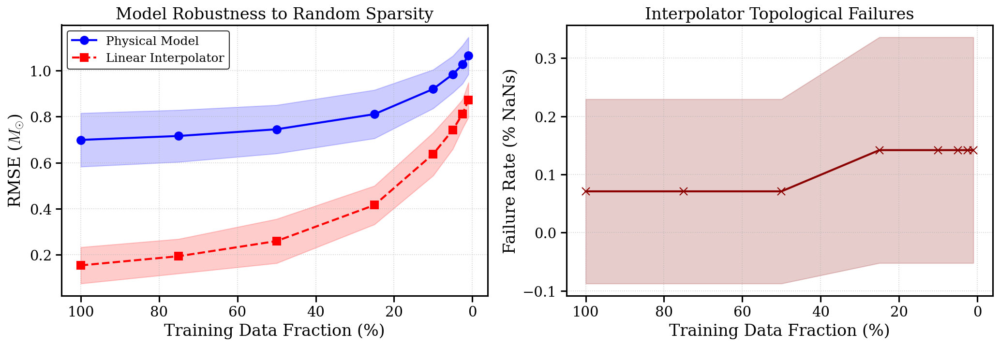

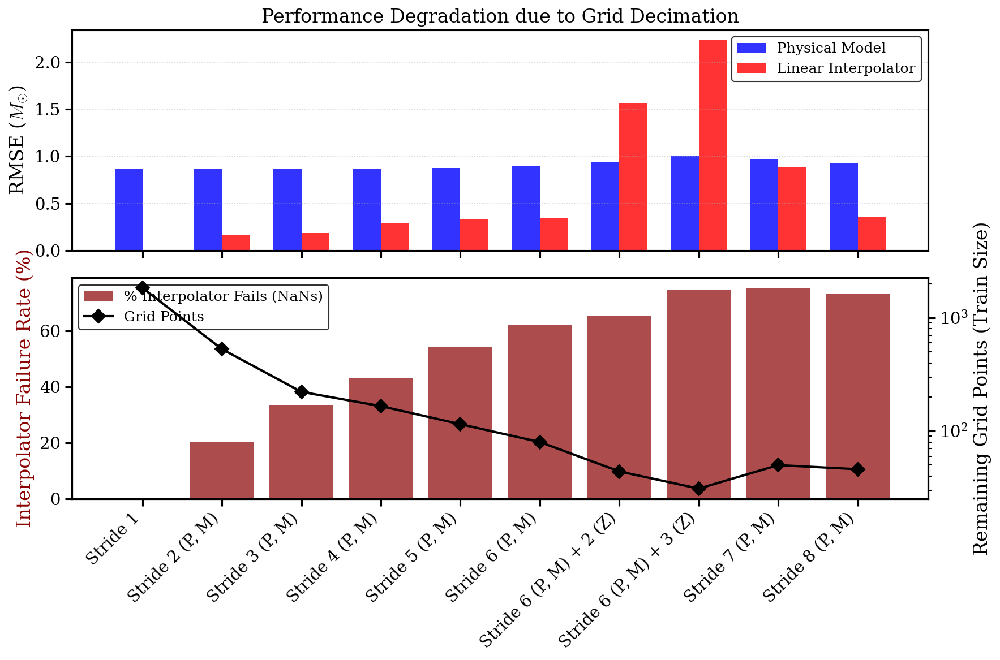

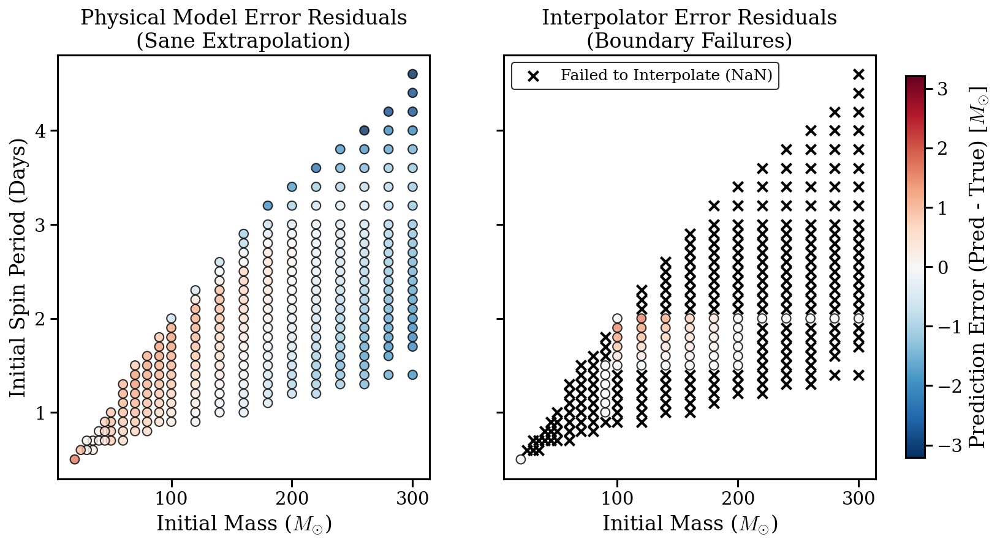

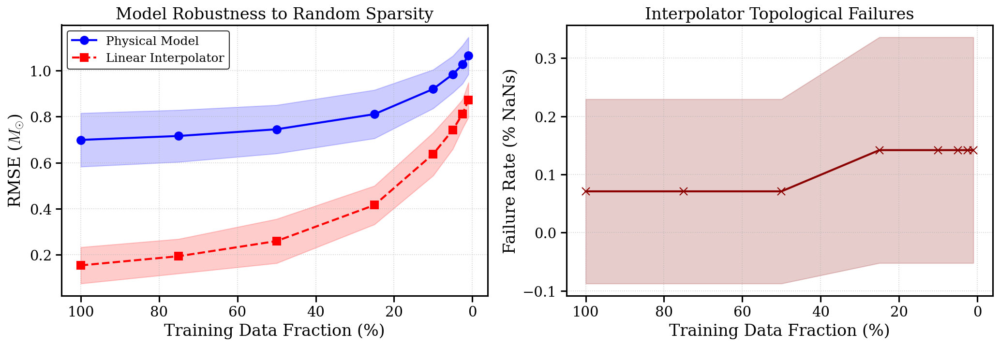

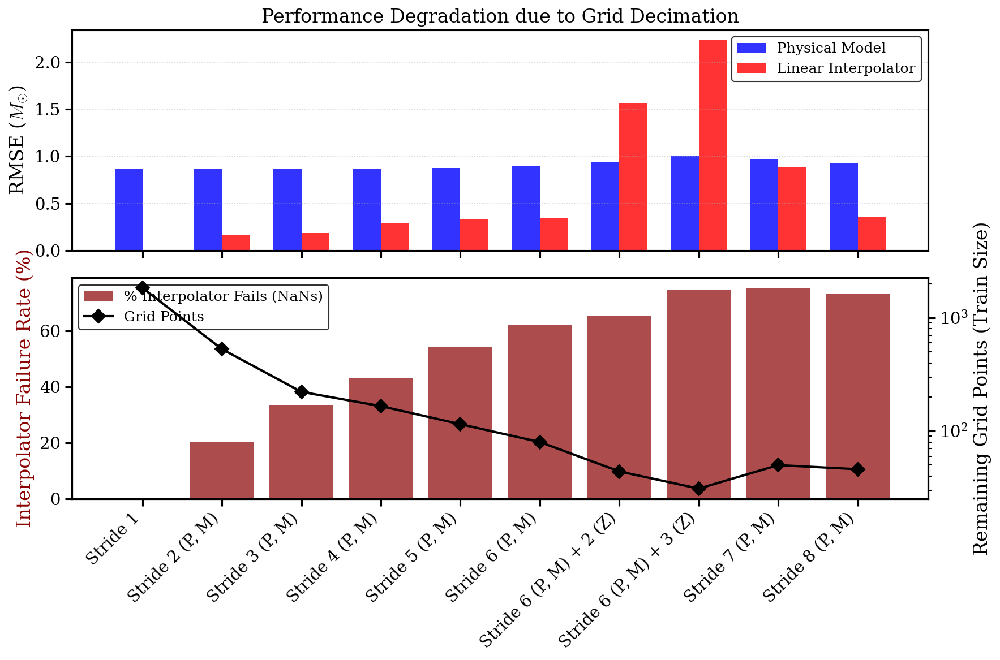

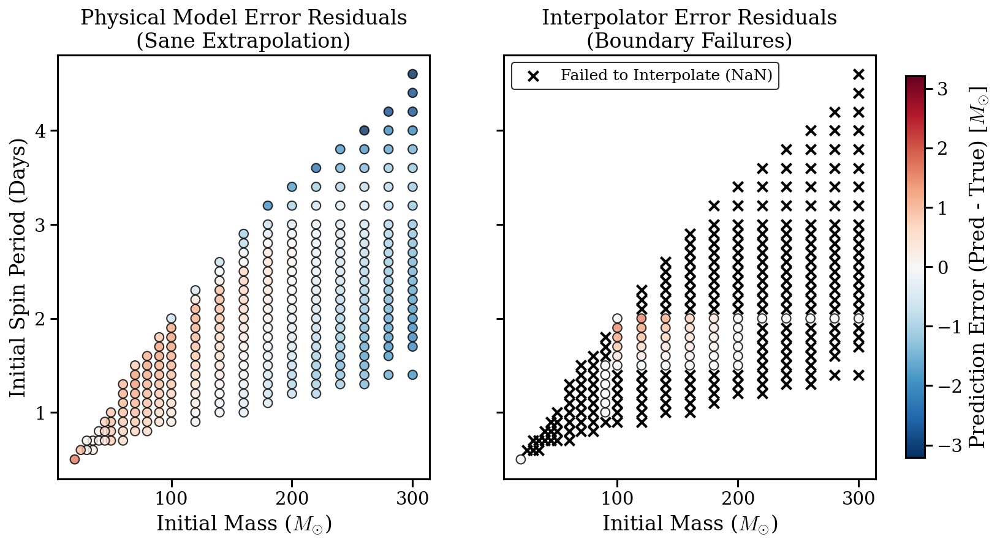

In [ ]:
import joblib

out_dir = OUTPUT_FOLDER / f'benchmark_{run_id}'
work_df = working_che_core_props_df

# Load the stored models from disk
phys_model = joblib.load(out_dir / "extrap_phys_model.pkl")
interp_model = joblib.load(out_dir / "extrap_interp_model.pkl")

# ---------------------------------------------------------
# 1. Random Sparsity Benchmark
# ---------------------------------------------------------
summary_df = pd.read_csv(out_dir / 'random_sparse_summary.csv') 

fig_random = plot_random_sparsity_benchmark(summary_df, show=False)
display(fig_random) 

# ---------------------------------------------------------
# 2. Structured Coarsening Benchmark
# ---------------------------------------------------------
coarse_df = pd.read_csv(out_dir / 'coarsening_results.csv')

fig_coarsening = plot_structured_coarsening_benchmark(coarse_df, show=False)
display(fig_coarsening)

# ---------------------------------------------------------
# 3. Structured Extrapolation (Spatial Residuals)
# ---------------------------------------------------------
# Since eval.py doesn't save the raw predictions to disk, we generate 
# them dynamically using the models returned by evaluate_structured_sparse_test

# NOTE: This assumes `work_df`, `phys_model`, and `interp_model` are currently 
# in your notebook's memory (e.g., returned from the eval module).

# 1. Generate Physical Model Predictions
phys_pred, _ = phys_model.get_mf_logtd(
    work_df['m_zams'].values, 
    work_df['p_spin_zams'].values, 
    work_df['z'].values
)

# 2. Generate Interpolator Predictions
interp_pred = []
for _, row in work_df.iterrows():
    try:
        val = interp_model.get_var(row['m_zams'], row['p_spin_zams'], row['z'])
        interp_pred.append(float(val))
    except Exception:
        interp_pred.append(np.nan)
interp_pred = np.array(interp_pred)

# 3. Plot the Extrapolation residuals
fig_extrap = plot_structured_extrapolation_spatial_residuals(
    test_df=work_df, 
    phys_pred=phys_pred, 
    interp_pred=interp_pred, 
    z_slice=0.1, # Adjust this to match a specific metallicity in your grid
    show=False
)
display(fig_extrap)